In [57]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
from bbknn import bbknn
import scanorama as scnrma
import pandas as pd
import seaborn as sns

from matplotlib.colors import ListedColormap

import warnings

warnings.filterwarnings('ignore')



sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=200)

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.17.2 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


In [58]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [59]:
def DE(adata, obs_id, obs_id_test, ref):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='wilcoxon', pts=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])

    l231_genes['LF'] = lfcs

    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>0.2]

    return pd.Series(l231_genes['LF']).sort_values(ascending=False)

# Read in all gluta ages

In [37]:
P8_glut = sc.read_h5ad(path_to_h5ads + 'P8_glut_02112021.h5ad')
P14_glut = sc.read_h5ad(path_to_h5ads + 'P14_glut_02112021.h5ad')
P17_glut = sc.read_h5ad(path_to_h5ads + 'P17_glut_12022020.h5ad')
P21_glut = sc.read_h5ad(path_to_h5ads + 'P21_glut_12012020.h5ad')
P28_glut = sc.read_h5ad(path_to_h5ads + 'P28_glut_03222021.h5ad')
P38_glut = sc.read_h5ad(path_to_h5ads + 'P38_glut_12012020.h5ad')

# Type UMAPs

In [350]:
types_order = ['L2/3_AB', 'L2/3_BC', 'L4_A', 'L4_B', 'L4_C', 
               'L5IT', 'L5PT_A', 'L5PT_B', 'L5NP', 
               'L6CT_A', 'L6CT_B', 'L6CT_C',
               'L6b', 'L6IT_A', 'L6IT_B', ]
cols = sns.color_palette('pastel').as_hex() + sns.color_palette('Set2').as_hex()[0:5]

P8_glut.obs['Type'] = P8_glut.obs['Type'].cat.reorder_categories(types_order, ordered=True)
P14_glut.obs['Type'] = P14_glut.obs['Type'].cat.reorder_categories(types_order, ordered=True)

P8_glut.uns['Type_colors'] = cols
P14_glut.uns['Type_colors'] = cols


In [351]:
adata = P8_glut.concatenate(P14_glut, P17_glut, P21_glut, P28_glut, P38_glut)

In [352]:
adata.uns['Type_colors'] = sns.color_palette('pastel').as_hex() + sns.color_palette('Set2').as_hex()


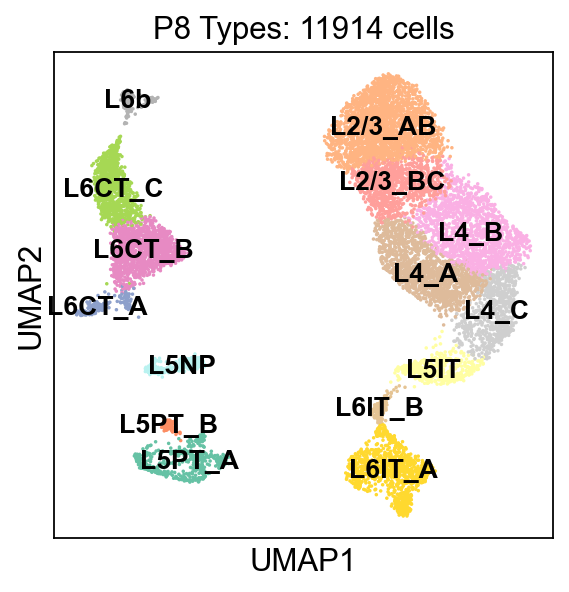

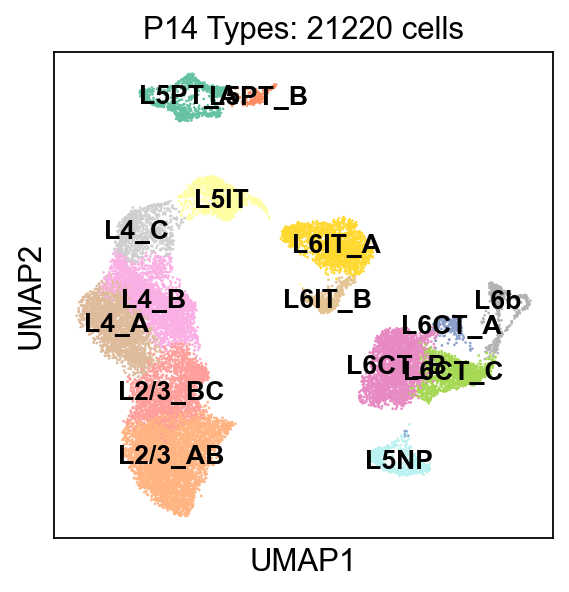

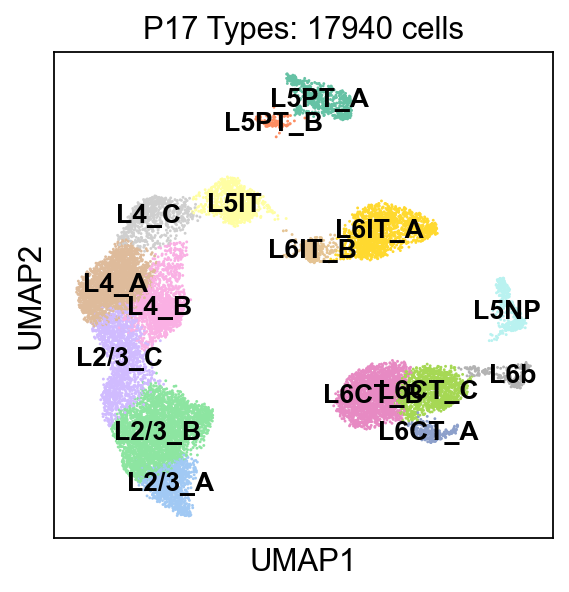

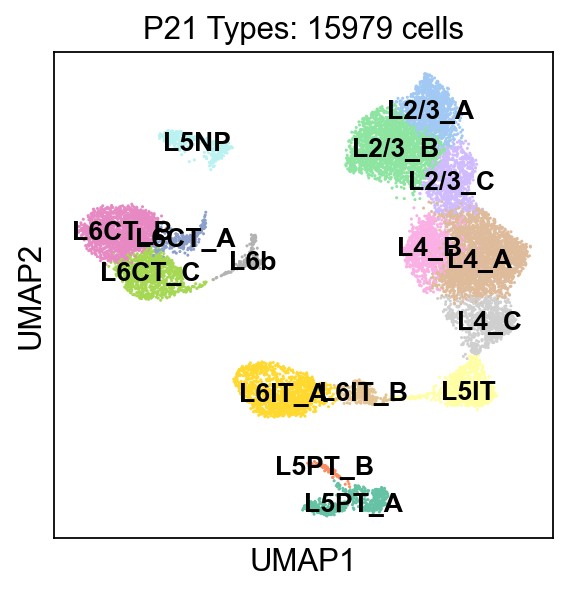

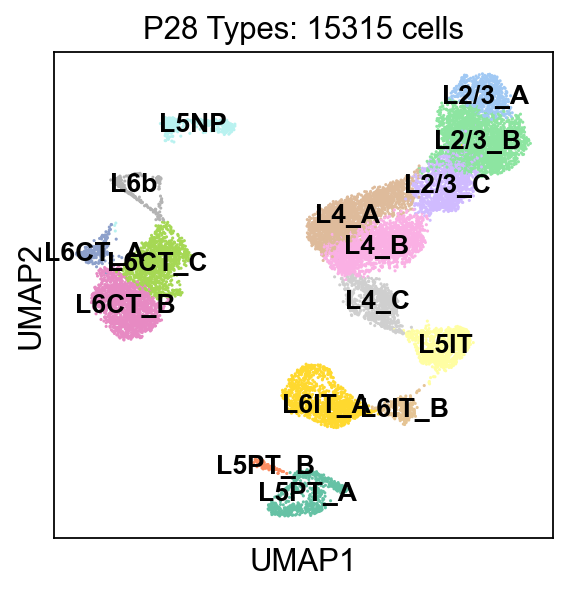

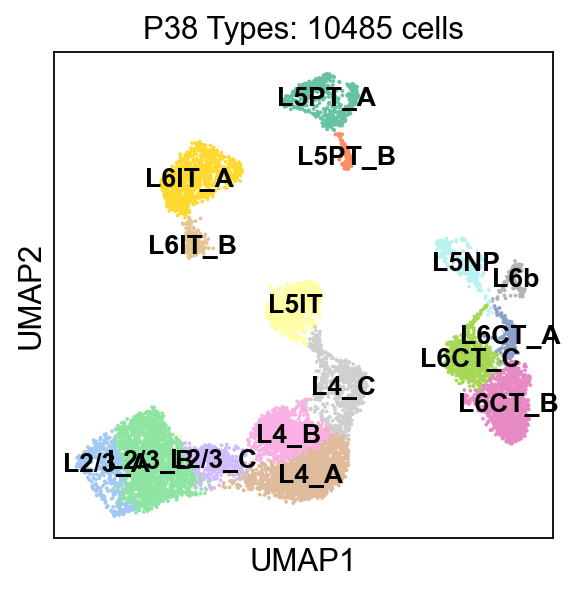

In [357]:
for i in adata.obs.Age.values.categories:

    age = adata[adata.obs.Age==i,:]
    sc.pl.umap(age, color='Type', legend_loc='on data', legend_fontsize='12',  title=i+' Types: ' + str(age.shape[0]) + ' cells', 
            save=i+'gluta.pdf')

In [ ]:
types_order = ['L2/3_A', 'L2/3_B', 'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 
               'L5IT', 'L5PT_A', 'L5PT_B', 'L5NP', 
               'L6CT_A', 'L6CT_B', 'L6CT_C',
               'L6b', 'L6IT_A', 'L6IT_B', ]

P17_glut.obs['Type'] = P17_glut.obs['Type'].cat.reorder_categories(types_order, ordered=True)
P21_glut.obs['Type'] = P21_glut.obs['Type'].cat.reorder_categories(types_order, ordered=True)
P28_glut.obs['Type'] = P28_glut.obs['Type'].cat.reorder_categories(types_order, ordered=True)
P38_glut.obs['Type'] = P38_glut.obs['Type'].cat.reorder_categories(types_order, ordered=True)

In [4]:
print(P8_glut.shape[0], P14_glut.shape[0], P17_glut.shape[0],
      P21_glut.shape[0], P28_glut.shape[0], P38_glut.shape[0])

11914 21220 17940 15979 15315 10485


In [5]:
sc.pp.subsample(P8_glut, fraction=3000/P8_glut.shape[0])
sc.pp.subsample(P14_glut, fraction=3000/P14_glut.shape[0])
sc.pp.subsample(P17_glut, fraction=3000/P17_glut.shape[0])
sc.pp.subsample(P21_glut, fraction=3000/P21_glut.shape[0])
sc.pp.subsample(P28_glut, fraction=3000/P28_glut.shape[0])
sc.pp.subsample(P38_glut, fraction=3000/P38_glut.shape[0])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [6]:
print(P8_glut.shape[0], P14_glut.shape[0], P17_glut.shape[0],
      P21_glut.shape[0], P28_glut.shape[0], P38_glut.shape[0])

3000 2999 3000 3000 3000 3000


In [7]:
gluta_sub = P8_glut.concatenate(P14_glut, P17_glut, P21_glut, P28_glut, P38_glut)

In [9]:
gluta_sub.obs.Subclass

TTGATGGTCAGACTGT-1-P8_2b-P8-P8_glut-0-0    L6CT
AGGACTTCACCCAACG-1-P8_2a-P8-P8_glut-0-0    L6CT
CCCTCTCCAACGTATC-1-P8_2a-P8-P8_glut-0-0    L2/3
CTCCATGTCGGCTGTG-1-P8_1b-P8-P8_glut-0-0    L2/3
TGTTGAGCAGTTGCGC-1-P8_2a-P8-P8_glut-0-0    L6CT
                                           ... 
CGCCAGAGTGGCTTAT-1-P38_2a-P38-5              L4
CACAGGCTCGTCAACA-1-P38_2a-P38-5              L4
TGCTTCGGTGGTCCCA-1-P38_1a-P38-5            L6IT
GATAGAACAAGAGCTG-1-P38_2a-P38-5              L4
CAACCTCTCAGTAGGG-1-P38_1a-P38-5            L2/3
Name: Subclass, Length: 17999, dtype: category
Categories (8, object): ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b']

In [10]:
layer = []

for i in range(gluta_sub.shape[0]):
    subclass = gluta_sub.obs.Subclass[i]
    if (subclass=='L2/3'): layer.append('L2/3')
    else: layer.append(subclass[0:2])

gluta_sub.obs['Subclass'] = pd.Categorical(layer)

In [13]:
gluta_sub.obs.Subclass

TTGATGGTCAGACTGT-1-P8_2b-P8-P8_glut-0-0      L6
AGGACTTCACCCAACG-1-P8_2a-P8-P8_glut-0-0      L6
CCCTCTCCAACGTATC-1-P8_2a-P8-P8_glut-0-0    L2/3
CTCCATGTCGGCTGTG-1-P8_1b-P8-P8_glut-0-0    L2/3
TGTTGAGCAGTTGCGC-1-P8_2a-P8-P8_glut-0-0      L6
                                           ... 
CGCCAGAGTGGCTTAT-1-P38_2a-P38-5              L4
CACAGGCTCGTCAACA-1-P38_2a-P38-5              L4
TGCTTCGGTGGTCCCA-1-P38_1a-P38-5              L6
GATAGAACAAGAGCTG-1-P38_2a-P38-5              L4
CAACCTCTCAGTAGGG-1-P38_1a-P38-5            L2/3
Name: Subclass, Length: 17999, dtype: category
Categories (4, object): ['L2/3', 'L4', 'L5', 'L6']

In [14]:
gluta_sub.write_h5ad('glut_sub_033121.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'Type' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


In [100]:
gluta_sub = gluta_sub[gluta_sub.obs.Type!='L2/3_AB',:]

## L4 write up

In [9]:
#this is a full object
L4 = P8_glut[P8_glut.obs.Subclass=='L4',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L4',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L4',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L4',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L4',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L4',:])

In [10]:
L4.write_h5ad('L4_030421.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


In [294]:
L4 = sc.read_h5ad('L4_030421.h5ad')

## L5 write up

In [11]:
def layerize(adata):
    layer = []
    for i in range(adata.shape[0]):
        if(adata.obs.Type[i][0:2]=='L2'): layer.append('L2/3')
        else: layer.append(adata.obs.Type[i][0:2])

    adata.obs['Layer'] = pd.Categorical(layer)
    return adata

In [12]:
P8_glut = layerize(P8_glut)
P14_glut = layerize(P14_glut)
P17_glut = layerize(P17_glut)
P21_glut = layerize(P21_glut)
P28_glut = layerize(P28_glut)
P38_glut = layerize(P38_glut)

In [13]:
#this is a full object
L5 = P8_glut[P8_glut.obs.Layer=='L5',:].concatenate(P14_glut[P14_glut.obs.Layer=='L5',:], 
                                                               P17_glut[P17_glut.obs.Layer=='L5',:], 
                                                               P21_glut[P21_glut.obs.Layer=='L5',:], 
                                                               P28_glut[P28_glut.obs.Layer=='L5',:], 
                                                               P38_glut[P38_glut.obs.Layer=='L5',:])

In [10]:
L5.write_h5ad('L5_030421.h5ad')

... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


## L6 write up

In [14]:
#this is a full object
L6 = P8_glut[P8_glut.obs.Layer=='L6',:].concatenate(P14_glut[P14_glut.obs.Layer=='L6',:], 
                                                               P17_glut[P17_glut.obs.Layer=='L6',:], 
                                                               P21_glut[P21_glut.obs.Layer=='L6',:], 
                                                               P28_glut[P28_glut.obs.Layer=='L6',:], 
                                                               P38_glut[P38_glut.obs.Layer=='L6',:])

In [15]:
L6.write_h5ad('L6_030421.h5ad')

... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'layer' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


# Type markers dotplot over time

## L23

In [9]:
#this is a full object
L23 = P8_glut[P8_glut.obs.Subclass=='L2/3',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L2/3',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L2/3',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L2/3',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L2/3',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L2/3',:])

In [10]:
age_type = []
for i in range(L23.shape[0]):
    age_type.append(L23.obs.Age[i] + '_' + L23.obs.Type[i].split('_')[1])

L23.obs['age_type'] = L23.obs['Subclass']
L23.obs['age_type'] = pd.Categorical(age_type)

In [28]:
L23.obs.

AAACGCTCACTTCATT-1-P8_1a-P8-P8_glut-0-1-0    L2/3_AB
AAAGGATAGGTGCATG-1-P8_1a-P8-P8_glut-0-1-0    L2/3_AB
AAAGGGCCAGTATACC-1-P8_1a-P8-P8_glut-0-1-0    L2/3_AB
AAAGTCCCATATACCG-1-P8_1a-P8-P8_glut-0-1-0    L2/3_AB
AAAGTCCTCAGATGCT-1-P8_1a-P8-P8_glut-0-1-0    L2/3_BC
                                              ...   
TTTGGAGGTCCGGACT-1-P38_2b-P38-5               L2/3_B
TTTGGTTAGTAGTCAA-1-P38_2b-P38-5               L2/3_B
TTTGGTTGTACGTGAG-1-P38_2b-P38-5               L2/3_A
TTTGGTTTCTCCGTGT-1-P38_2b-P38-5               L2/3_A
TTTGTTGTCCATGATG-1-P38_2b-P38-5               L2/3_B
Name: Type, Length: 26520, dtype: object

In [29]:
P28type = []

for i in range(L23.shape[0]):
    
    if (L23.obs.Age[i] in ['P8', 'P14']):
        P28type.append(L23.obs.P28_Type[i])
        
    else:
        P28type.append(L23.obs.Type[i])
        
L23.obs['P28_Type'] = pd.Categorical(P28type, dtype='category')

In [37]:
L23.write_h5ad('L23_021322.h5ad')

... storing 'Age' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'layer' as categorical
... storing 'Type' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


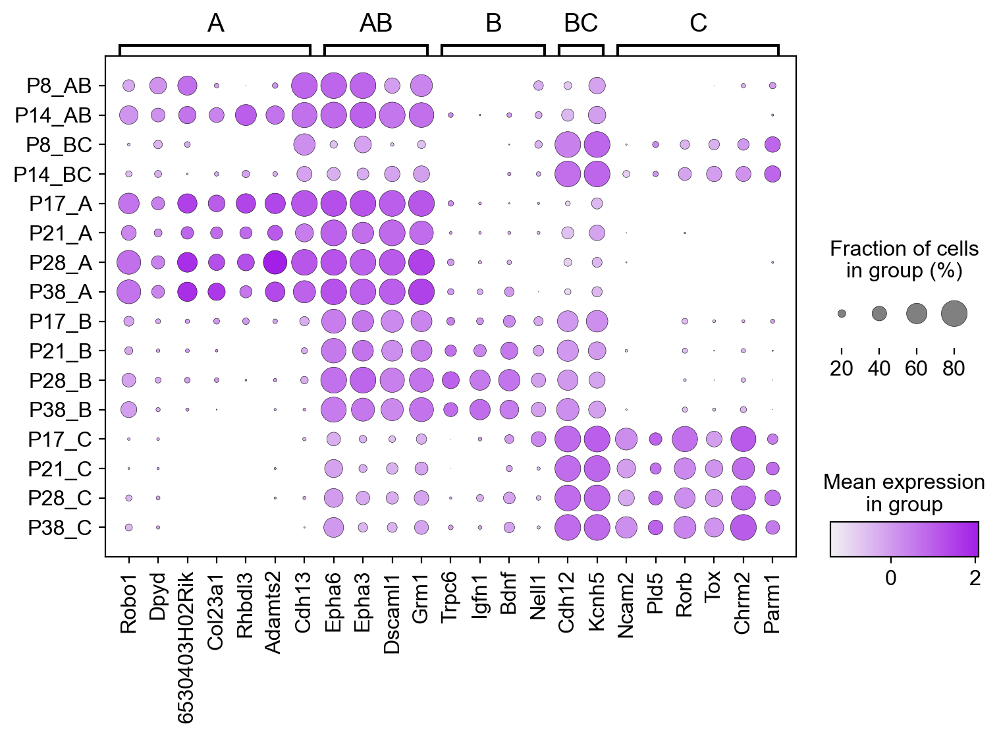

In [102]:
markers = ['Robo1', 'Dpyd', '6530403H02Rik', 'Col23a1', 'Rhbdl3', 'Adamts2',  'Cdh13',
           'Epha6',  'Epha3', 'Dscaml1', 'Grm1',
           'Trpc6', 'Igfn1', 'Bdnf', 'Nell1',
           'Cdh12', 'Kcnh5',
           
           'Ncam2', 'Pld5', 'Rorb', 'Tox',  'Chrm2', 'Parm1',]

cats = ['P8_AB', 'P14_AB', 'P8_BC', 'P14_BC', 'P17_A', 'P21_A', 'P28_A', 'P38_A',
        'P17_B', 'P21_B', 'P28_B', 'P38_B',
         'P17_C', 'P21_C', 'P28_C', 'P38_C']

sc.pl.dotplot(L23, markers, groupby='age_type', categories_order = cats, 
              var_group_labels=['A', 'AB', 'B', 'BC', 'C'], 
              var_group_positions=[(0,6), (7,10), (11,14), (15,16), (17,22)], 
              var_group_rotation='0', dot_min= 0.05, dot_max=0.8,
              cmap=mapcol,
                    use_raw=False,figsize=(8.5,5), save='L23markers_time.pdf')

In [7]:
sns.color_palette("light:#5A9", as_cmap=True)

In [18]:
from matplotlib.colors import ListedColormap
ListedColormap(sns.color_palette(colors[i], n_colors=100).as_hex())

In [ ]:
ListedColormap(sns.color_palette("light:#639CDE", n_colors=100).as_hex())

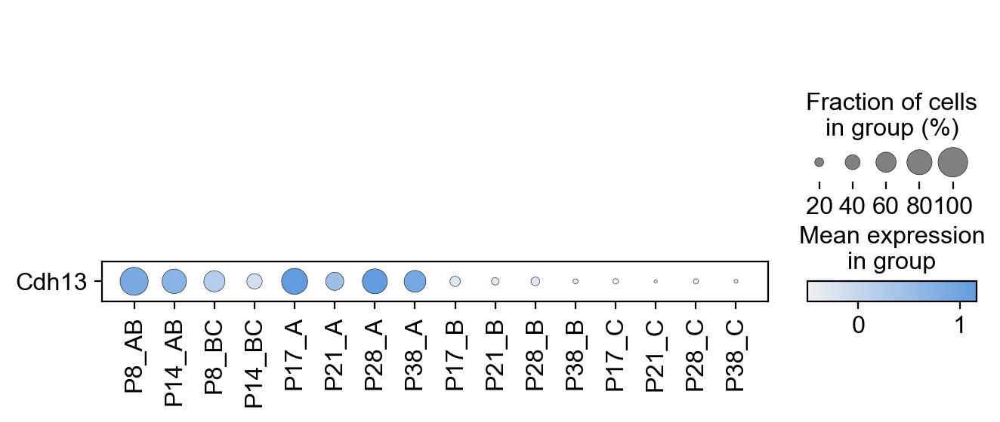

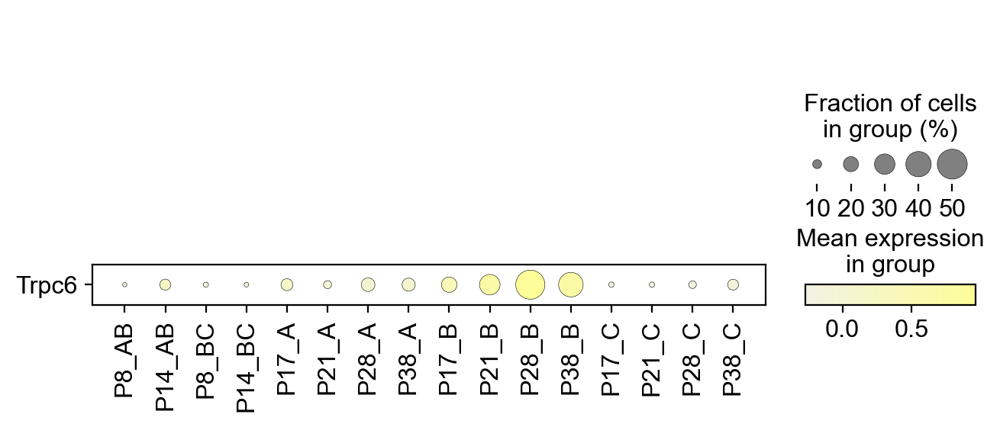

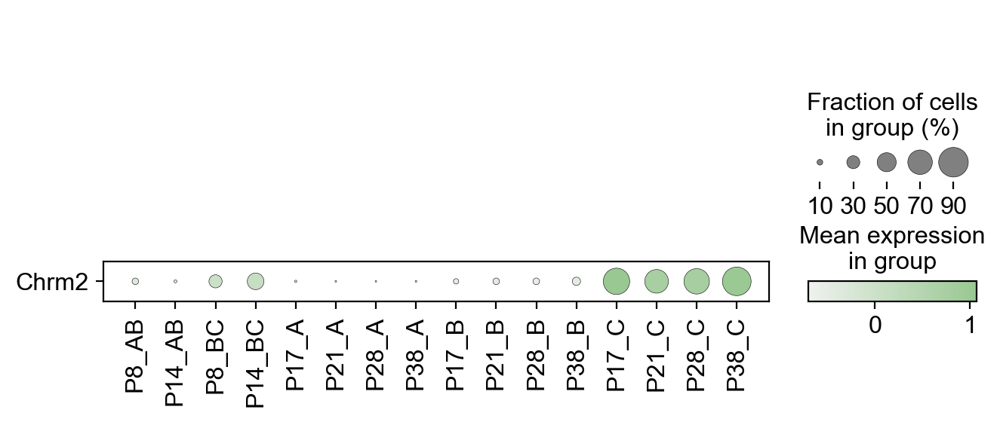

In [19]:

cats = ['P8_AB', 'P14_AB', 'P8_BC', 'P14_BC', 'P17_A', 'P21_A', 'P28_A', 'P38_A',
        'P17_B', 'P21_B', 'P28_B', 'P38_B',
         'P17_C', 'P21_C', 'P28_C', 'P38_C']
#colors = ['Blues_r', 'Wistia_r', 'Greens']
#colors = ['light:#639CDE', '#FDFD99', '#99C892']
colors  = ["light:#639CDE", "light:#FDFD99", "light:#99C892"]

marks = ['Cdh13', 'Trpc6', 'Chrm2']
for i in range(len(marks)):
    
    mapcol = ListedColormap(sns.color_palette(colors[i], n_colors=100).as_hex())
    
    sc.pl.dotplot(L23, marks[i], groupby='age_type', categories_order = cats,
                        use_raw=False, swap_axes=True, 
                  cmap=mapcol, save= marks[i] + '.pdf')




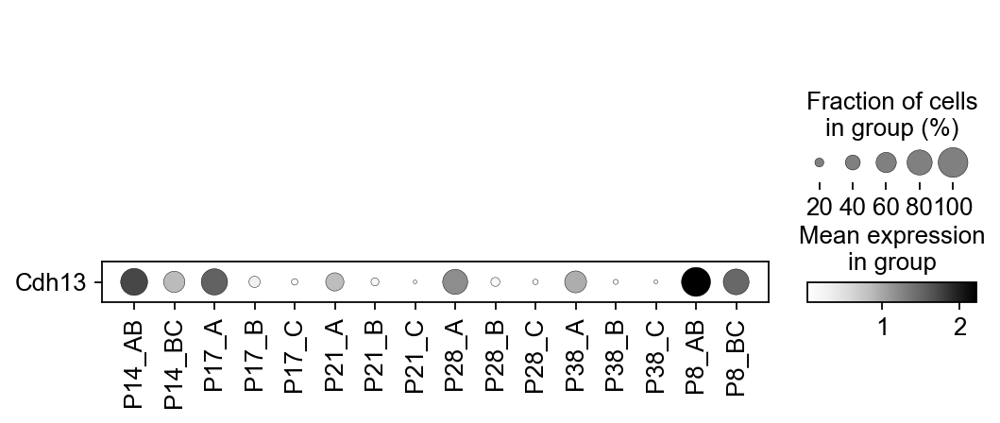

In [51]:
sc.pl.dotplot(L23, 'Cdh13', groupby='age_type', swap_axes=True, cmap='Greys', save='greys.pdf')

## L4

In [296]:
age_type = []
for i in range(L4.shape[0]):
    age_type.append(L4.obs.Age[i] + '_' + L4.obs.Type[i].split('_')[1])

L4.obs['age_type'] = L4.obs['Subclass']
L4.obs['age_type'] = pd.Categorical(age_type)

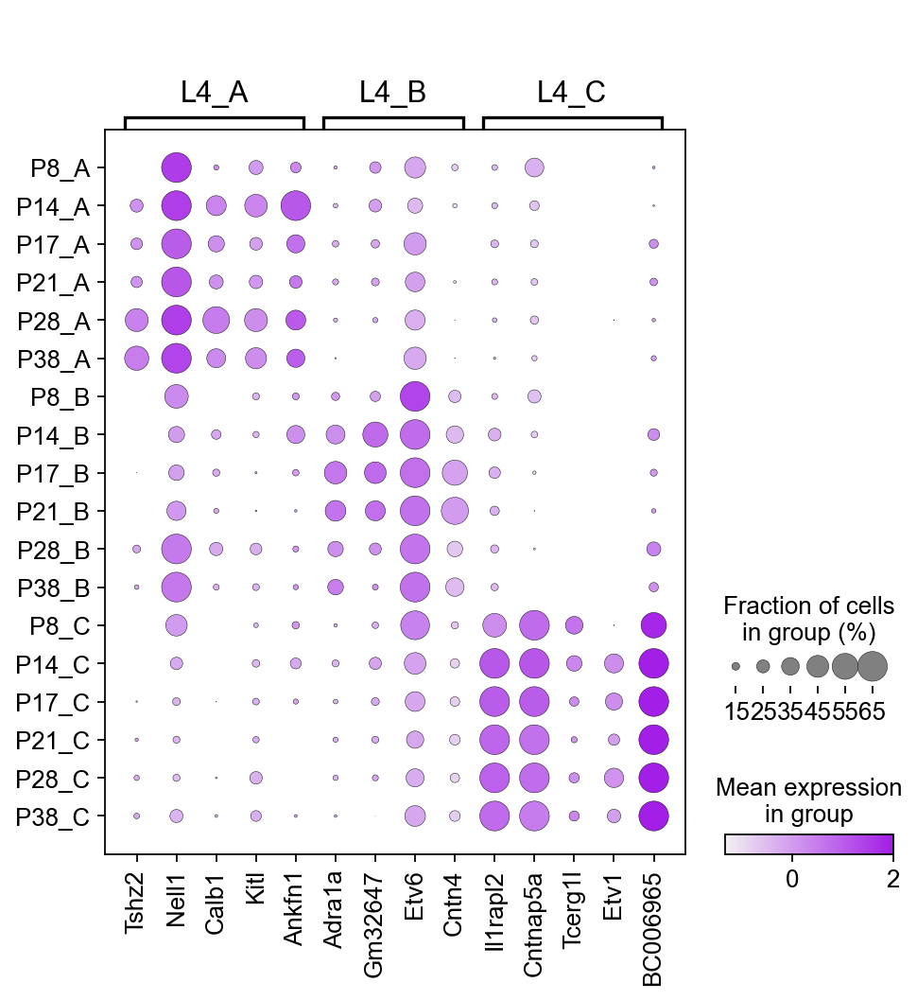

In [297]:
cats =['P8_A', 'P14_A', 'P17_A', 'P21_A', 'P28_A', 'P38_A',
        'P8_B', 'P14_B', 'P17_B', 'P21_B', 'P28_B', 'P38_B',
         'P8_C', 'P14_C', 'P17_C', 'P21_C', 'P28_C', 'P38_C']
sc.pl.dotplot(L4, 
              ['Tshz2', 'Nell1', 'Calb1', 'Kitl', 'Ankfn1', 
               'Adra1a', 'Gm32647', 'Etv6', 'Cntn4',
              'Il1rapl2', 'Cntnap5a', 'Tcerg1l', 'Etv1', 'BC006965'], 
              categories_order=cats,
              groupby='age_type', use_raw=False, dot_min=0.05, dot_max=0.65, vmax=2, 
              cmap = mapcol,
             var_group_labels=['L4_A', 'L4_B', 'L4_C'], 
              var_group_positions=[(0,4), (5,8), (9,13)], save='L4markers_time.pdf')

## L5

In [299]:
age_type = []
for i in range(L5.shape[0]):
    age_type.append(L5.obs.Age[i] + '_' + L5.obs.Type[i].split('5')[1])

L5.obs['age_type'] = L5.obs['Subclass']
L5.obs['age_type'] = pd.Categorical(age_type)

In [300]:
L5.obs['age_type'].values.categories

Index(['P14_IT', 'P14_NP', 'P14_PT_A', 'P14_PT_B', 'P17_IT', 'P17_NP',
       'P17_PT_A', 'P17_PT_B', 'P21_IT', 'P21_NP', 'P21_PT_A', 'P21_PT_B',
       'P28_IT', 'P28_NP', 'P28_PT_A', 'P28_PT_B', 'P38_IT', 'P38_NP',
       'P38_PT_A', 'P38_PT_B', 'P8_IT', 'P8_NP', 'P8_PT_A', 'P8_PT_B'],
      dtype='object')

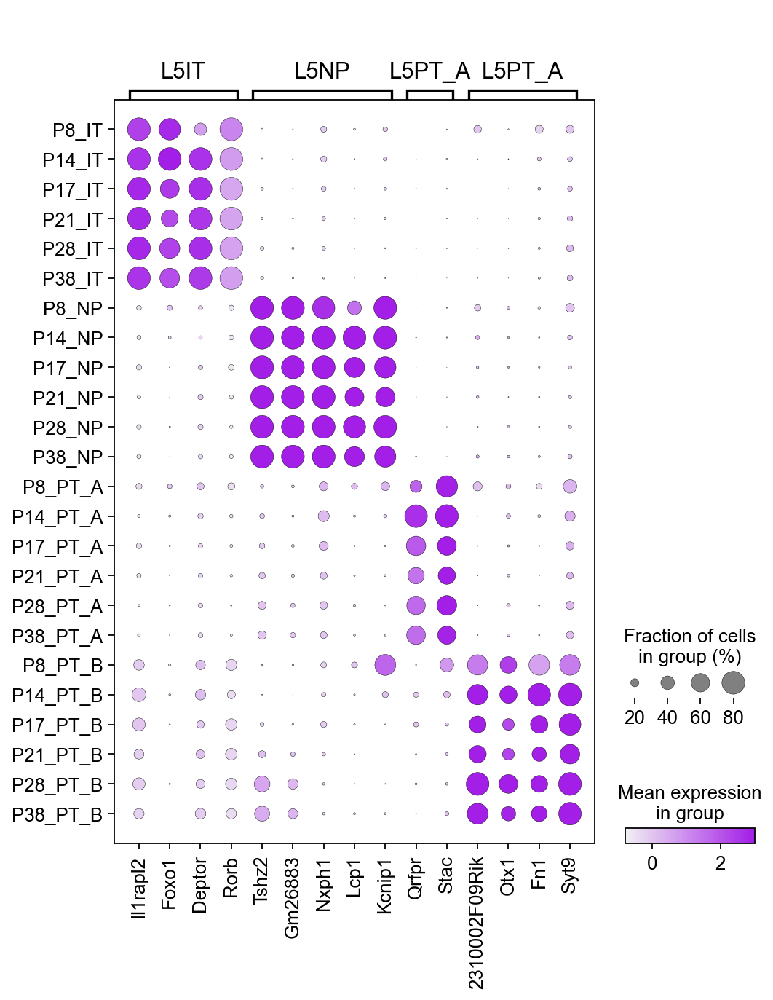

In [302]:
cats =['P8_IT', 'P14_IT', 'P17_IT', 'P21_IT', 'P28_IT', 'P38_IT', 
       'P8_NP', 'P14_NP', 'P17_NP', 'P21_NP','P28_NP', 'P38_NP',
       'P8_PT_A', 'P14_PT_A', 'P17_PT_A', 'P21_PT_A', 'P28_PT_A', 'P38_PT_A',
       'P8_PT_B', 'P14_PT_B',  'P17_PT_B', 'P21_PT_B', 'P28_PT_B', 'P38_PT_B',]
sc.pl.dotplot(L5, var_names= ['Il1rapl2', 'Foxo1', 'Deptor', 'Rorb',
             'Tshz2', 'Gm26883', 'Nxph1', 'Lcp1', 'Kcnip1', 
             'Qrfpr', 'Stac', 
             '2310002F09Rik', 'Otx1', 'Fn1', 'Syt9',], 
              categories_order=cats,
              groupby='age_type', use_raw=False, dot_max=0.8, vmax=3, 
              var_group_labels=['L5IT', 'L5NP', 'L5PT_A', 'L5PT_A'], 
              var_group_positions=[(0,3), (4,8), (9,10), (11,14)], var_group_rotation='0',
              cmap = mapcol,
            save='L5markers_time.pdf')

  

## L6

In [113]:
L6.obs.Type.values.categories

Index(['L6CT_B', 'L6IT_A', 'L6CT_C', 'L6CT_A', 'L6b', 'L6IT_B'], dtype='object')

In [304]:
age_type = []
for i in range(L6.shape[0]):
    age_type.append(L6.obs.Age[i] + '_' + L6.obs.Type[i].split('6')[1])

L6.obs['age_type'] = L6.obs['Subclass']
L6.obs['age_type'] = pd.Categorical(age_type)

In [126]:
L6.obs['age_type'].values.categories

Index(['P14_CT_A', 'P14_CT_B', 'P14_CT_C', 'P14_IT_A', 'P14_IT_B', 'P14_b',
       'P17_CT_A', 'P17_CT_B', 'P17_CT_C', 'P17_IT_A', 'P17_IT_B', 'P17_b',
       'P21_CT_A', 'P21_CT_B', 'P21_CT_C', 'P21_IT_A', 'P21_IT_B', 'P21_b',
       'P28_CT_A', 'P28_CT_B', 'P28_CT_C', 'P28_IT_A', 'P28_IT_B', 'P28_b',
       'P38_CT_A', 'P38_CT_B', 'P38_CT_C', 'P38_IT_A', 'P38_IT_B', 'P38_b',
       'P8_CT_A', 'P8_CT_B', 'P8_CT_C', 'P8_IT_A', 'P8_IT_B', 'P8_b'],
      dtype='object')

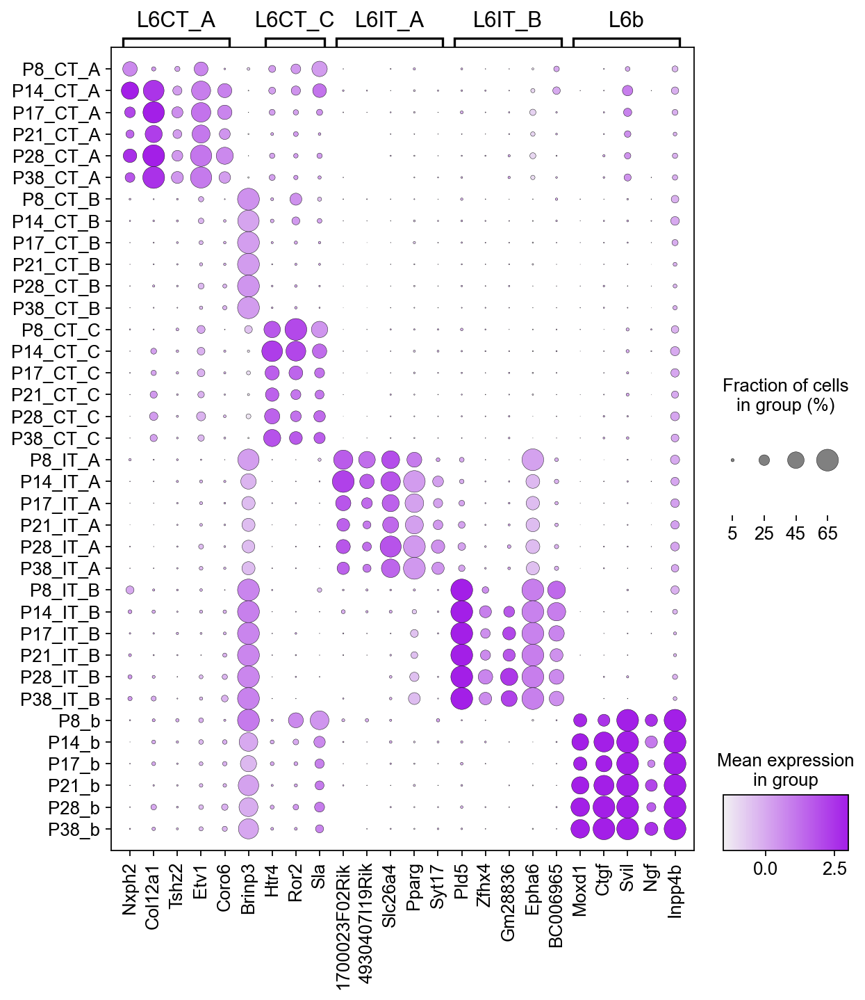

In [306]:
cats =['P8_CT_A', 'P14_CT_A', 'P17_CT_A', 'P21_CT_A', 'P28_CT_A', 'P38_CT_A', 
       'P8_CT_B', 'P14_CT_B', 'P17_CT_B', 'P21_CT_B', 'P28_CT_B', 'P38_CT_B', 
       'P8_CT_C', 'P14_CT_C', 'P17_CT_C', 'P21_CT_C', 'P28_CT_C', 'P38_CT_C', 
       'P8_IT_A','P14_IT_A', 'P17_IT_A', 'P21_IT_A', 'P28_IT_A', 'P38_IT_A',
      'P8_IT_B','P14_IT_B', 'P17_IT_B', 'P21_IT_B', 'P28_IT_B', 'P38_IT_B',
      'P8_b','P14_b', 'P17_b', 'P21_b', 'P28_b', 'P38_b',]

       
L6_genes = ['Nxph2', 'Col12a1', 'Tshz2', 'Etv1', 'Coro6',
            'Brinp3',
            'Htr4', 'Ror2', 'Sla',
            '1700023F02Rik', '4930407I19Rik', 'Slc26a4', 'Pparg', 'Syt17',
            'Pld5', 'Zfhx4', 'Gm28836', 'Epha6', 'BC006965',
            'Moxd1', 'Ctgf', 'Svil', 'Ngf', 'Inpp4b']

sc.pl.dotplot(L6, var_names= L6_genes, 
              categories_order=cats,
              groupby='age_type', use_raw=False, dot_max=0.65, vmax=3,  
              var_group_labels=['L6CT_A', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b'], 
              var_group_positions=[(0,4),  (6,8), (9,13), (14,18), (19,23)], var_group_rotation='0',
              figsize=(8.5,9.5),
              cmap = mapcol,
              save='L6markers_time.pdf')

  
   

# Type markers by layer

In [237]:
L23 = L23[L23.obs.Age!='P8']
L23 = L23[L23.obs.Age!='P14']

In [102]:
for i in ['L2/3_A', 'L2/3_B', 'L2/3_C']:
    print(DE(adata=gluta_sub[gluta_sub.obs.Layer=='L2/3'], obs_id='Type', obs_id_test = i, ref='rest')[0:5])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
Trying to set attribute `.uns` of view, copying.


['Adamts2', '6530403H02Rik', 'Rhbdl3', 'Col23a1', 'Cdh13']


Trying to set attribute `.uns` of view, copying.


['Igfn1', 'Trpc6', 'Sorcs3', 'Bdnf', 'Baz1a']


Trying to set attribute `.uns` of view, copying.


['Chrm2', 'Shisa6', 'Rorb', 'Parm1', 'Cadps2']


In [96]:
from matplotlib.colors import ListedColormap
mapcol = ListedColormap(sns.color_palette('light:#a31fe7', n_colors=100).as_hex())


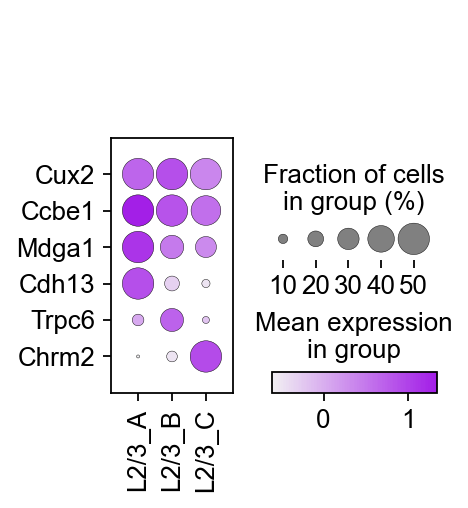

In [238]:
sc.pl.dotplot(L23, ['Cux2', 'Ccbe1', 'Mdga1', 
                    'Cdh13', 'Trpc6', 'Chrm2'], 
              groupby='Type',swap_axes=True, use_raw=False, dot_min=0,dot_max=0.5, cmap=mapcol,
              save='L23_type_markersS6.pdf')

In [15]:
for i in ['L4_A', 'L4_B', 'L4_C']:
    print(DE(adata=L4, obs_id='Type', obs_id_test = i, ref='rest')[0:5].index)

Index(['Tshz2', 'Nell1', 'Calb1', 'Kitl', 'Ankfn1'], dtype='object')
Index(['Adra1a', 'Gm32647', 'Etv6', 'Cntn4', 'Alcam'], dtype='object')
Index(['Il1rapl2', 'Cntnap5a', 'Tcerg1l', 'Etv1', 'BC006965'], dtype='object')


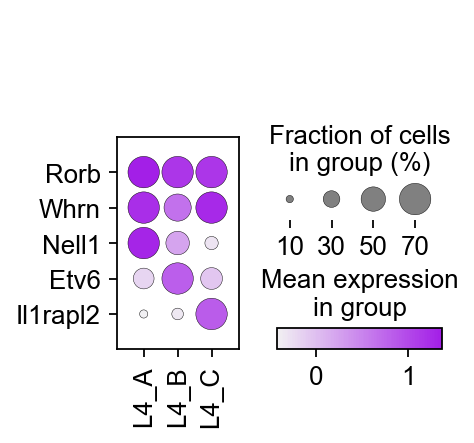

In [240]:
sc.pl.dotplot(L4, ['Rorb', 'Whrn', 
                    'Nell1', 'Etv6', 'Il1rapl2'], 
              groupby='Type',swap_axes=True, use_raw=False, dot_min=0,dot_max=0.7, cmap=mapcol,
              save='L4_type_markersS6.pdf')

In [73]:
for i in ['L5IT', 'L5NP', 'L5PT_A', 'L5PT_B',]:
    print(DE(adata=gluta_sub[gluta_sub.obs.Layer=='L5'], obs_id='Type', obs_id_test = i, ref='rest')[0:5])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
Trying to set attribute `.uns` of view, copying.


['Il1rapl2', 'Foxo1', 'Ptprm', 'Deptor', 'Rorb']


Trying to set attribute `.uns` of view, copying.


['Tshz2', 'Gm26883', 'Nxph1', 'Lcp1', 'Kcnip1']


Trying to set attribute `.uns` of view, copying.


['Qrfpr', 'Stac', 'Dscaml1', 'Gm2164', 'Erg']


Trying to set attribute `.uns` of view, copying.


['2310002F09Rik', 'Otx1', 'Fn1', 'Syt9', 'Grin3a']


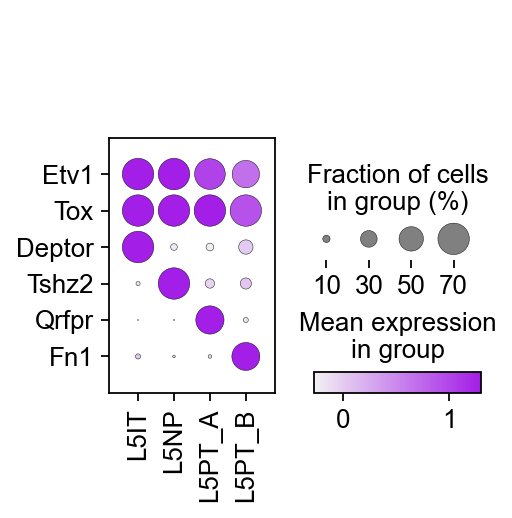

In [241]:
sc.pl.dotplot(L5, ['Etv1', 'Tox', 'Deptor', 'Tshz2', 'Qrfpr', 'Fn1'], 
              categories_order = ['L5IT', 'L5NP', 'L5PT_A', 'L5PT_B'],  
              groupby='Type',swap_axes=True, use_raw=False, dot_max=0.7, vmax=1.3,cmap=mapcol,
             save='L5_type_markersS6.pdf')

In [22]:
for i in ['L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b']:
    print(DE(adata=L6, obs_id='Type', obs_id_test = i, ref='rest')[0:5].index)

Index(['Nxph2', 'Col12a1', 'Tshz2', 'Etv1', 'Coro6'], dtype='object')
Index(['Hcrtr2', 'Hs3st4', 'Meis2', 'Abi3bp', 'Foxp2'], dtype='object')
Index(['Htr4', 'Ror2', 'Mgat4c', 'Sla', 'Trabd2b'], dtype='object')
Index(['1700023F02Rik', '4930407I19Rik', 'Slc26a4', 'Pparg', 'Syt17'], dtype='object')
Index(['Pld5', 'Zfhx4', 'Gm28836', 'Epha6', 'BC006965'], dtype='object')
Index(['Moxd1', 'Ctgf', 'Svil', 'Ngf', 'Inpp4b'], dtype='object')


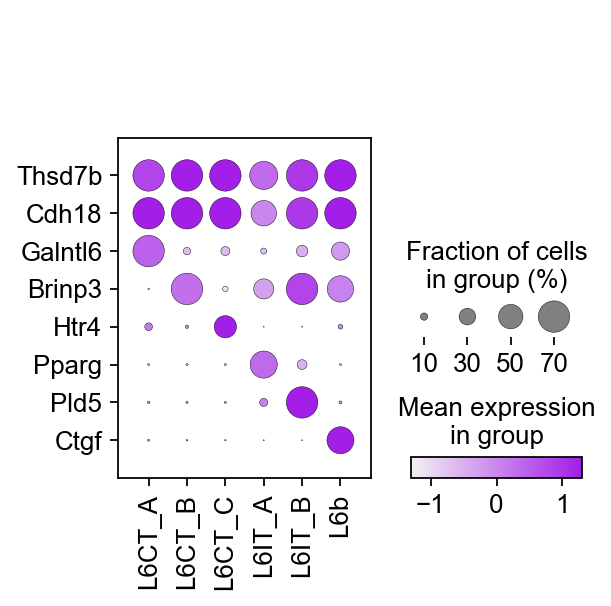

In [242]:
sc.pl.dotplot(L6, ['Thsd7b', 'Cdh18',
                   'Galntl6', 
                   'Brinp3', 
                   'Htr4',
                   'Pparg',
                   'Pld5',
                   'Ctgf'],
              
              categories_order = ['L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b'],
              groupby='Type',swap_axes=True, use_raw=False, dot_max=0.7, vmax=1.3, cmap=mapcol,
             save='L6_type_markersS6.pdf')

# Misc analysis

## ARI barplot

### DR and DL

In [50]:
P28_DR = np.load(path+'ARI_P28_DR.npy')

P38_DR = np.load(path+'ARI_P38_DR.npy')

P28_DL = np.load(path+'ARI_P28_DL.npy')

In [51]:
df = pd.DataFrame({
    'Time point': [ 'L2/3', 'L2/3', 'L2/3', 
                   'L4', 'L4', 'L4',
                   'L5', 'L5', 'L5',
                   'L6', 'L6', 'L6'],
    'Mapping': ['P28_DR', 'P38_DR', 'P28_DL',
                'P28_DR', 'P38_DR', 'P28_DL',
                 'P28_DR', 'P38_DR', 'P28_DL',
               'P28_DR', 'P38_DR', 'P28_DL',],
    'ARI': [P28_DR[0], P38_DR[0], P28_DL[0],
           P28_DR[1], P38_DR[1], P28_DL[1],
           P28_DR[2], P38_DR[2], P28_DL[2],
           P28_DR[3], P38_DR[3], P28_DL[3],]})

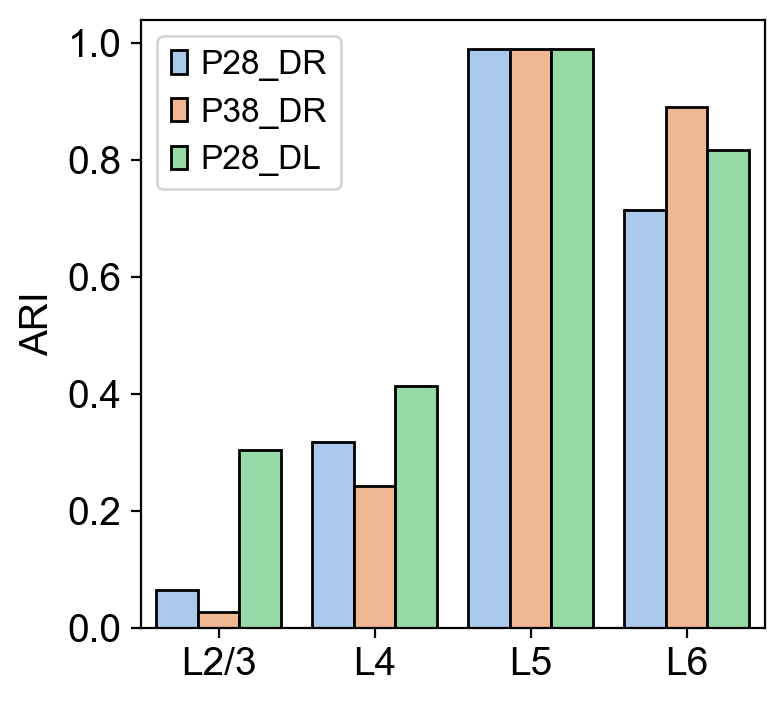

In [52]:
sns.barplot(x='Time point', y='ARI', hue='Mapping', 
            data=df, edgecolor="black", linewidth=1, palette='pastel')
plt.legend(fontsize=12)
plt.grid(False)
plt.xlabel('')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel(ylabel = 'ARI', fontsize=14)

plt.savefig('ActivityARIs_gluta.pdf')

### Just DR

In [359]:
df = pd.DataFrame({
    'Time point': [ 'L2/3', 'L2/3',
                   'L4', 'L4',
                   'L5', 'L5',
                   'L6', 'L6',],
    'Mapping': ['P28_DR', 'P38_DR', 
                'P28_DR', 'P38_DR',
                 'P28_DR', 'P38_DR',
               'P28_DR', 'P38_DR',],
    'ARI': [P28_DR[0], P38_DR[0],
           P28_DR[1], P38_DR[1],
           P28_DR[2], P38_DR[2],
           P28_DR[3], P38_DR[3],]})

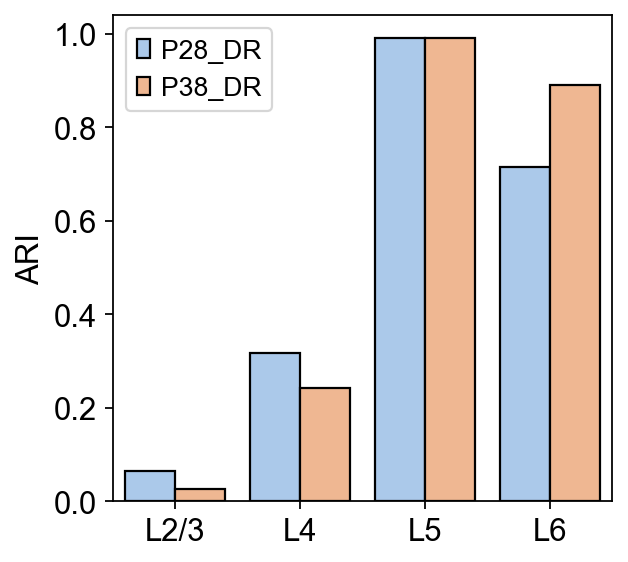

In [360]:
sns.barplot(x='Time point', y='ARI', hue='Mapping', 
            data=df, edgecolor="black", linewidth=1, palette='pastel')
plt.legend(fontsize=12)
plt.grid(False)
plt.xlabel('')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel(ylabel = 'ARI', fontsize=14)

plt.savefig('ActivityARIs_glutaDR.pdf')

## L2/3 type UMAPs

Trying to set attribute `.uns` of view, copying.


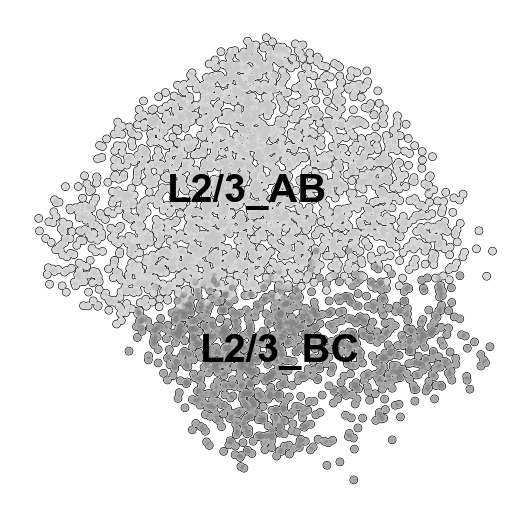

In [234]:
sc.set_figure_params(dpi_save=1000)
sc.pl.umap(L23[L23.obs.Age=='P8',:], color='Type', legend_loc='on data', frameon=False, 
           palette= ['#c7c7c7', '#808080'] ,  legend_fontsize=18, 
           title='', add_outline=True, outline_width=(0.1, 0.045),
           save='P8_l23.pdf')

#['#639CDE',  '#99C892']

#['#639CDE', '#FDFD99', '#99C892'],

# L23 type barplot

In [244]:
L23.X = L23.raw.X.A

In [263]:
genes_obj = L23[:,['Cdh13','Trpc6','Chrm2']]

In [271]:
genes_obj.obs['Cdh13'] = genes_obj.raw.X[:,genes_obj.var_names.get_loc('Cdh13')].A
genes_obj.obs['Trpc6'] = genes_obj.raw.X[:,genes_obj.var_names.get_loc('Trpc6')].A
genes_obj.obs['Chrm2'] = genes_obj.raw.X[:,genes_obj.var_names.get_loc('Chrm2')].A

In [273]:
genes_obj.raw.X[:,genes_obj.var_names.get_loc('Cdh13')].A

array([[2.7705555],
       [2.8836038],
       [2.4605017],
       ...,
       [2.3121264],
       [1.8155891],
       [2.1122613]], dtype=float32)

In [276]:
df = genes_obj.obs[['Age', 'Cdh13','Trpc6','Chrm2']]

In [286]:
df.to_csv('L23df_full.csv')

In [245]:
def singles(focus, others):
    
    focus_return = []
    for i in focus:
        if (i not in list(others[0])+list(others[1])):
            focus_return.append(i)
            
    return focus_return
    

def A_B(A, B, C):
    
    A_B = []
    for i in set(A).intersection(set(B)):
        if (i not in C):
            A_B.append(i)
            
    return A_B
        

In [246]:
marks = [[], [], [],
        [], [], [], 
         []]
dubs_trips = [[], [], [], []]

m=0
genes = ['Cdh13', 'Cdh13_Chrm2', 'Cdh13_Trpc6', 'Trpc6','Trpc6_Chrm2',
        'Chrm2', 'Triple']
genes.reverse()
for gene in genes:
    for i in L23.obs['Age'].values.categories:
        age = L23[L23.obs.Age==i,:]

        cdh13_ = np.where(age.X[:,age.var_names.get_loc('Cdh13')]>0)[0]
        trpc6_  = np.where(age.X[:,age.var_names.get_loc('Trpc6')]>0)[0]
        chrm2_ = np.where(age.X[:,age.var_names.get_loc('Chrm2')]>0)[0]
        
        cdh13 = singles(cdh13_, [trpc6_, chrm2_])
        trpc6 = singles(trpc6_, [cdh13_, chrm2_])
        chrm2 = singles(chrm2_, [cdh13_, trpc6_])
        
        
        cdh13_chrm2 = A_B(cdh13_, chrm2_, trpc6_)
        cdh13_trpc6 = A_B(cdh13_, trpc6_, chrm2_)
        trpc6_chrm2 = A_B(trpc6_, chrm2_, cdh13_)
        
        trip = set(cdh13_).intersection(set(trpc6_))
        triple = set(trip).intersection(set(chrm2_))

        #denom = len(set((list(cdh13)+list(trpc6)+list(chrm2)+list(cdh13_chrm2)+list(cdh13_trpc6)+list(trpc6_chrm2)+list(triple))))
        #denom = len(set((list(cdh13)+list(trpc6)+list(chrm2))))
        
        denom = len(cdh13)+len(trpc6)+len(chrm2)+len(cdh13_chrm2)+len(cdh13_trpc6)+len(trpc6_chrm2)+len(triple)
        
        #marks[m].append(np.where(age.X[:,age.var_names.get_loc(gene)]>0)[0].shape[0]/age.shape[0])
        
        if gene=='Cdh13':
            marks[m].append(len(cdh13)/denom)
    
        
        elif gene=='Trpc6':
            marks[m].append(len(trpc6)/denom)
        
        
        elif gene=='Chrm2':
            marks[m].append(len(chrm2)/denom)
            
        elif gene=='Cdh13_Chrm2':
            marks[m].append((len(cdh13_chrm2))/denom)
            
        elif gene=='Cdh13_Trpc6':
            marks[m].append((len(cdh13_trpc6))/denom)
            
        elif gene=='Trpc6_Chrm2':
            marks[m].append((len(trpc6_chrm2))/denom)
            
        elif gene=='Triple':
            marks[m].append((len(triple))/denom)
        
        #marks[m].append(np.where(age.X[:,age.var_names.get_loc(gene)]>0)[0].shape[0]/denom)

    m = m + 1


In [258]:
perc_exp = pd.DataFrame(np.transpose(np.array(marks)), index=L23.obs['Age'].values.categories, 
                        columns=genes)
perc_exp

,Triple,Chrm2,Trpc6_Chrm2,Trpc6,Cdh13_Trpc6,Cdh13_Chrm2,Cdh13
P8,0.006884,0.015019,0.000626,0.001877,0.033166,0.164268,0.778160
P14,0.008417,0.052882,0.003477,0.023788,0.083074,0.116194,0.712168
P17,0.012580,0.311155,0.027397,0.117976,0.089181,0.059268,0.382443
P21,0.017355,0.294215,0.046281,0.210744,0.083884,0.029752,0.317769
P28,0.019874,0.279637,0.081939,0.264644,0.100070,0.042190,0.211646
P38,0.011256,0.292062,0.080569,0.324052,0.075237,0.026066,0.190758


In [260]:
perc_exp.to_csv('L23_df.csv')

In [11]:
perc_exp = pd.read_csv('L23_df.csv')

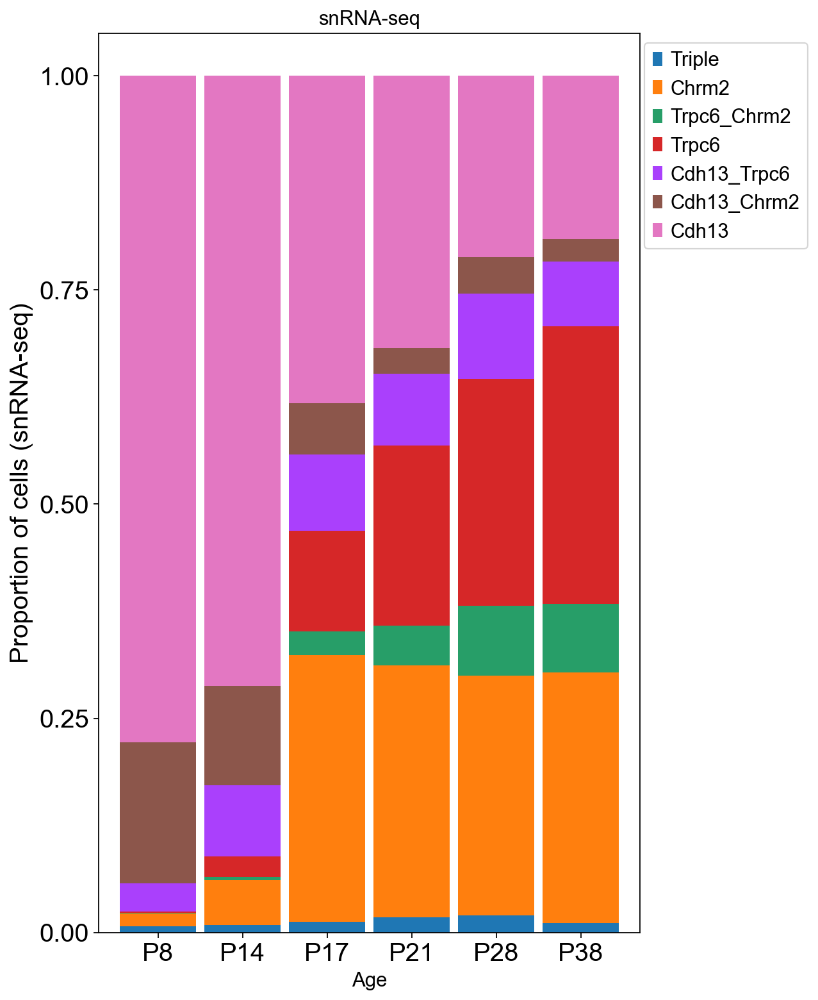

In [248]:
perc_exp.plot(
    kind = 'barh',
    stacked = True,
    title = 'snRNA-seq',
    mark_right = True,
    grid=False, linewidth=0.5, width=0.9, figsize=(8.2,10))
plt.legend(bbox_to_anchor=(0.99, 1), loc='upper left', fontsize=14, ncol=1)
plt.ylabel('Proportion of cells (snRNA-seq)', fontsize='18')
plt.xlabel('Age')
plt.yticks([0,0.25,0.50, 0.75, 1.00], fontsize=18)
plt.xticks(rotation='0', fontsize=18)
plt.tight_layout()
plt.savefig('Percent_exp_markers.pdf', dpi=200)
plt.show()

In [15]:
perc_exp.index = perc_exp['Unnamed: 0']

In [17]:
del perc_exp['Unnamed: 0']

In [18]:
perc_exp

,Triple,Chrm2,Trpc6_Chrm2,Trpc6,Cdh13_Trpc6,Cdh13_Chrm2,Cdh13
Unnamed: 0,,,,,,,
P8,0.006884,0.015019,0.000626,0.001877,0.033166,0.164268,0.778160
P14,0.008417,0.052882,0.003477,0.023788,0.083074,0.116194,0.712168
P17,0.012580,0.311155,0.027397,0.117976,0.089181,0.059268,0.382443
P21,0.017355,0.294215,0.046281,0.210744,0.083884,0.029752,0.317769
P28,0.019874,0.279637,0.081939,0.264644,0.100070,0.042190,0.211646
P38,0.011256,0.292062,0.080569,0.324052,0.075237,0.026066,0.190758


In [20]:
hi = perc_exp.reindex(index=perc_exp.index[::-1])


In [21]:
hi

,Triple,Chrm2,Trpc6_Chrm2,Trpc6,Cdh13_Trpc6,Cdh13_Chrm2,Cdh13
Unnamed: 0,,,,,,,
P38,0.011256,0.292062,0.080569,0.324052,0.075237,0.026066,0.190758
P28,0.019874,0.279637,0.081939,0.264644,0.100070,0.042190,0.211646
P21,0.017355,0.294215,0.046281,0.210744,0.083884,0.029752,0.317769
P17,0.012580,0.311155,0.027397,0.117976,0.089181,0.059268,0.382443
P14,0.008417,0.052882,0.003477,0.023788,0.083074,0.116194,0.712168
P8,0.006884,0.015019,0.000626,0.001877,0.033166,0.164268,0.778160


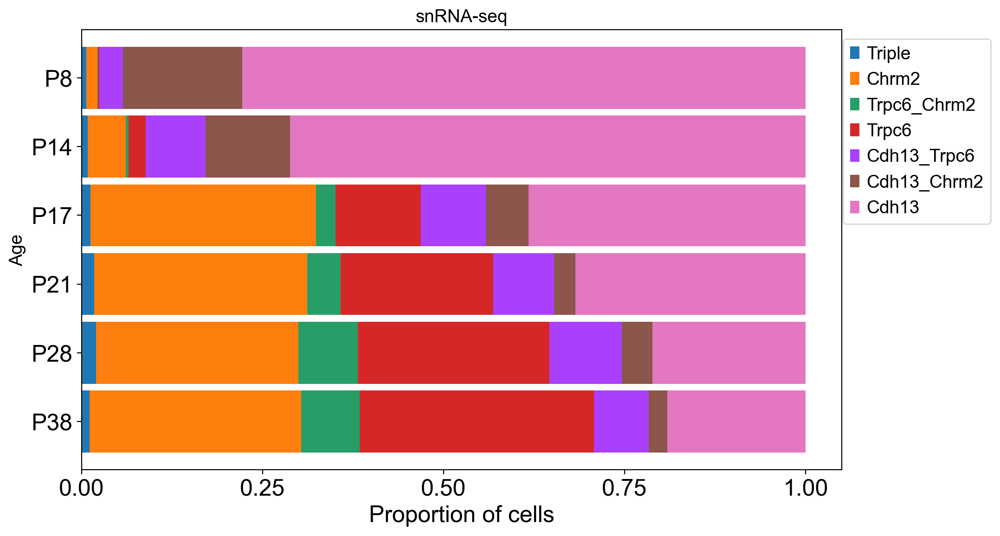

In [29]:
hi.plot(
    kind = 'barh',
    stacked = True,
    title = 'snRNA-seq',
    mark_right = True,
    grid=False, linewidth=0.5, width=0.9, figsize=(11,6))
plt.legend(bbox_to_anchor=(0.99, 1), loc='upper left', fontsize=14, ncol=1)
plt.xlabel('Proportion of cells', fontsize='18')
plt.ylabel('Age')
plt.xticks([0,0.25,0.50, 0.75, 1.00], fontsize=18)
plt.yticks(rotation='0', fontsize=18)
plt.tight_layout()
plt.savefig('Percent_exp_markers_horiz.pdf', dpi=200)
plt.show()

# Projection markers

In [20]:
L23_early = L23[L23.obs.Age=='P8',:].concatenate(L23[L23.obs.Age=='P14',:])
L23_late = L23[L23.obs.Age=='P17',:].concatenate(L23[L23.obs.Age=='P21',:],
                                                L23[L23.obs.Age=='P28',:],
                                                L23[L23.obs.Age=='P38',:])

... storing 'Age' as categorical
... storing 'cluster' as categorical
... storing 'sample' as categorical
... storing 'C26_decision' as categorical
... storing 'leiden_new' as categorical
... storing 'age_type' as categorical


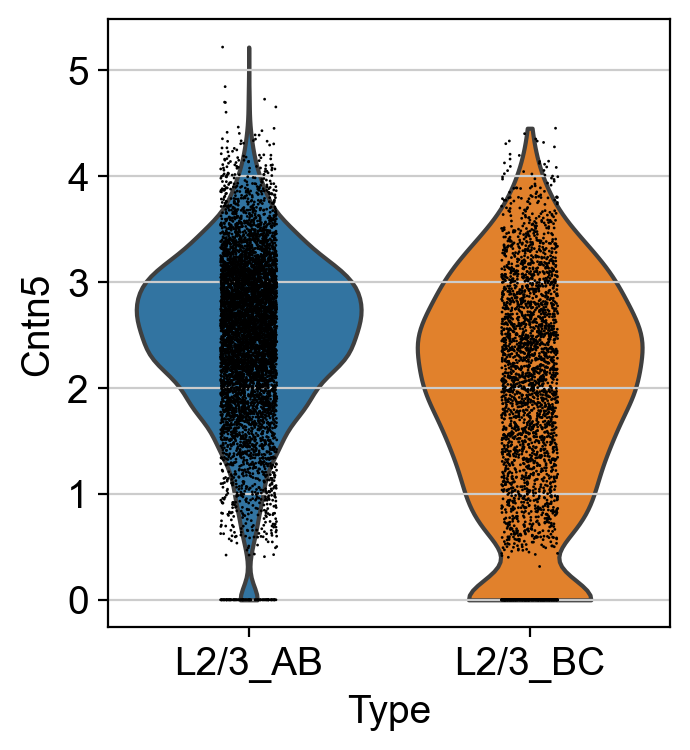

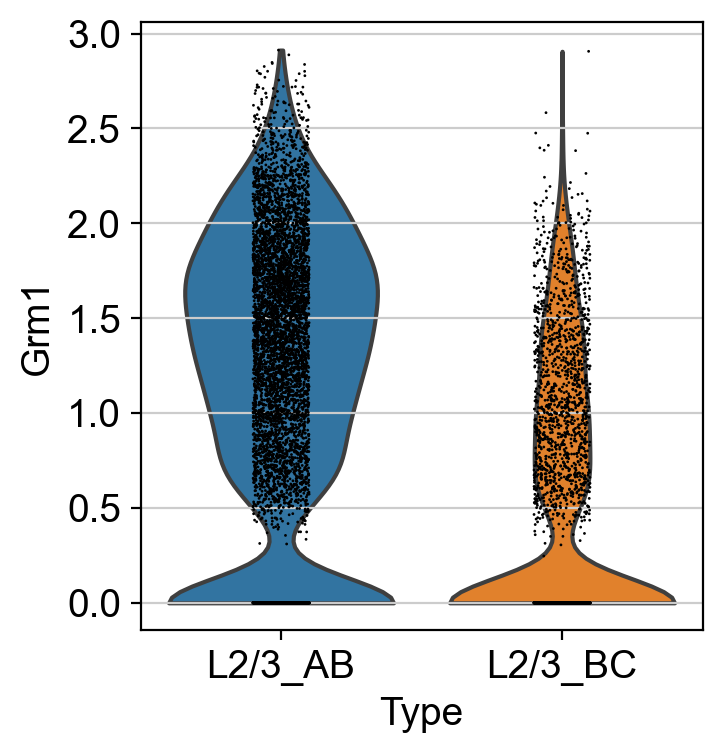

... storing 'Age' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'layer' as categorical
... storing 'sample_new' as categorical
... storing 'age_type' as categorical


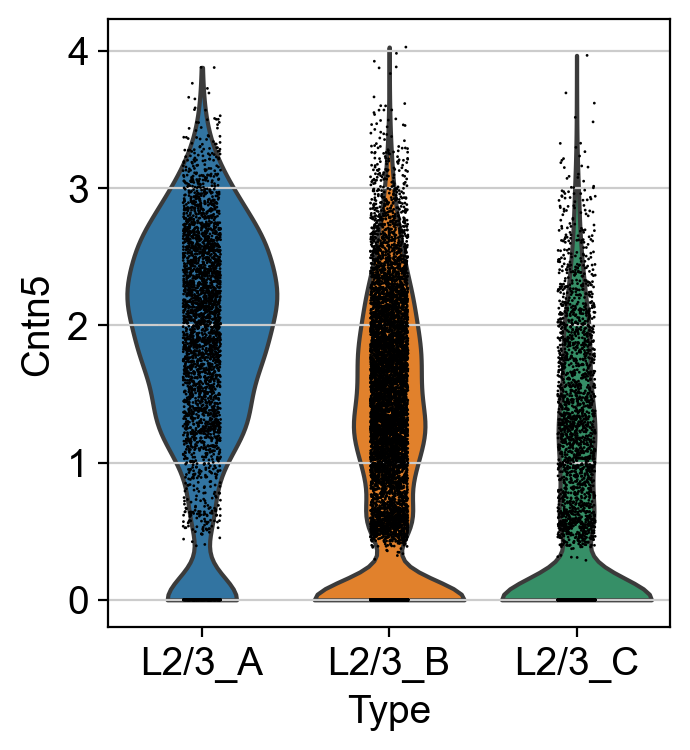

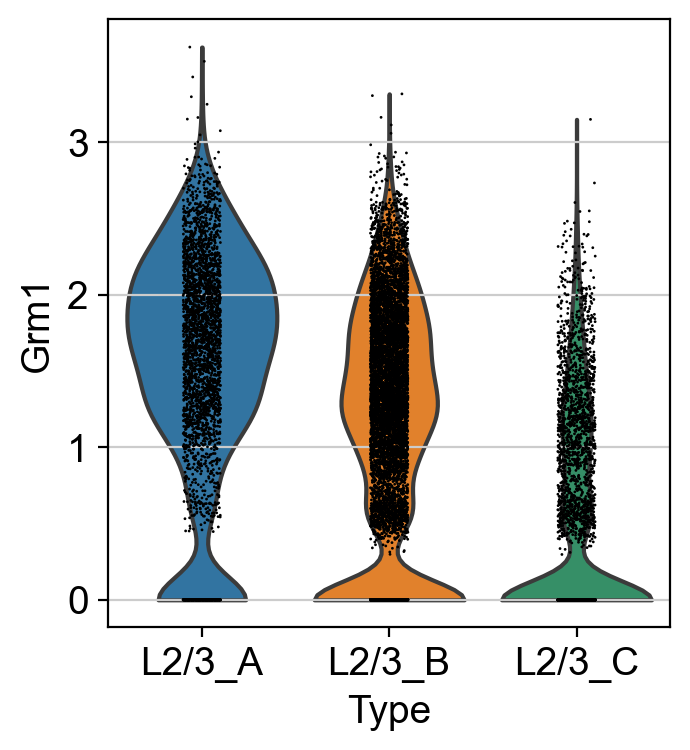

In [21]:
sc.pl.violin(L23_early, 'Cntn5', groupby='Type', save='earlyCntn5.pdf')
sc.pl.violin(L23_early, 'Grm1', groupby='Type',save = 'earlyGrm1.pdf')
sc.pl.violin(L23_late, 'Cntn5', groupby='Type',save='lateCntn5.pdf')
sc.pl.violin(L23_late, 'Grm1', groupby='Type', save='lateGrm1.pdf')

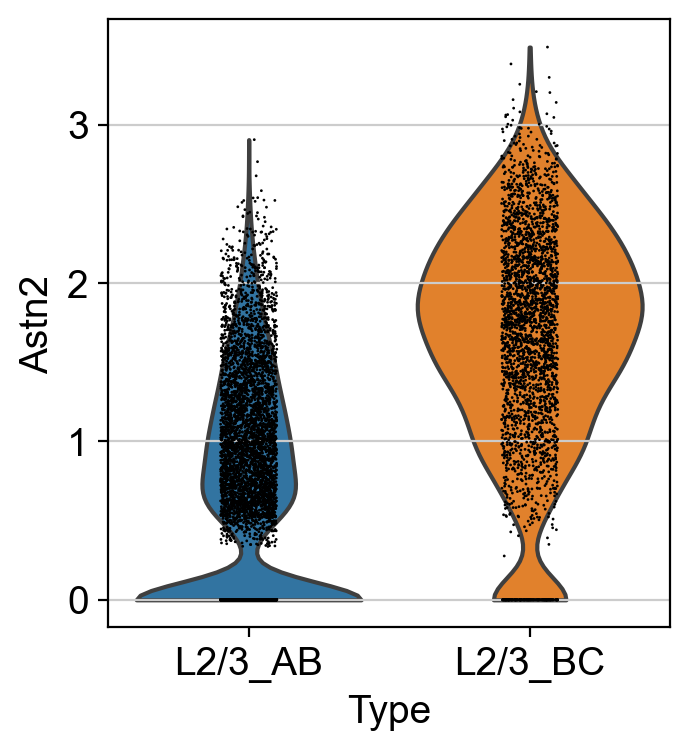

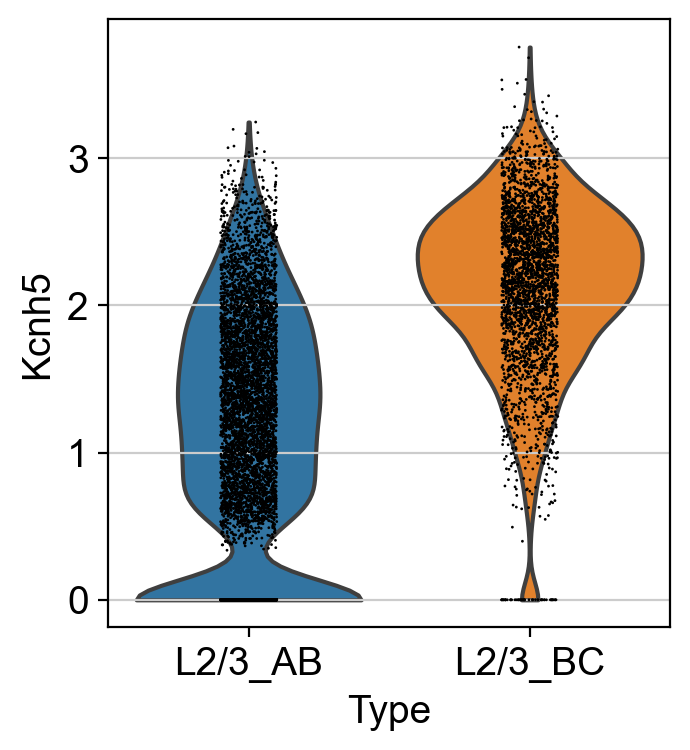

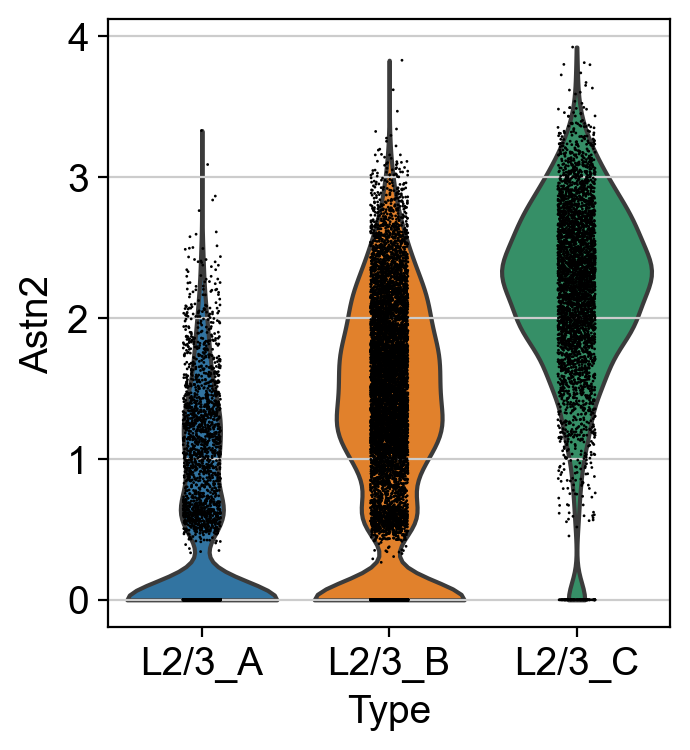

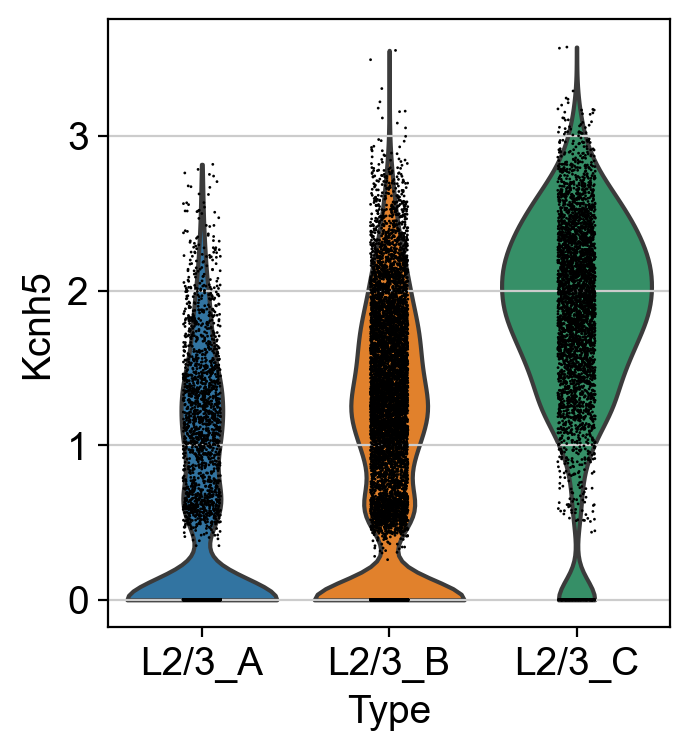

In [22]:
sc.pl.violin(L23_early, 'Astn2', groupby='Type', save='earlyAstn2.pdf')
sc.pl.violin(L23_early, 'Kcnh5', groupby='Type',save = 'earlyKcnh5.pdf')
sc.pl.violin(L23_late, 'Astn2', groupby='Type',save='lateAstn2.pdf')
sc.pl.violin(L23_late, 'Kcnh5', groupby='Type', save='lateKcnh5.pdf')

In [57]:
tips = sns.load_dataset("tips")

In [61]:
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


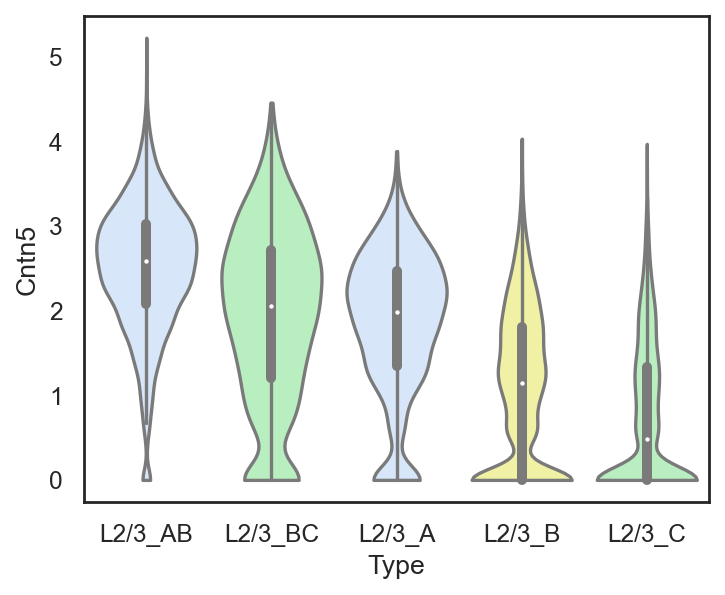

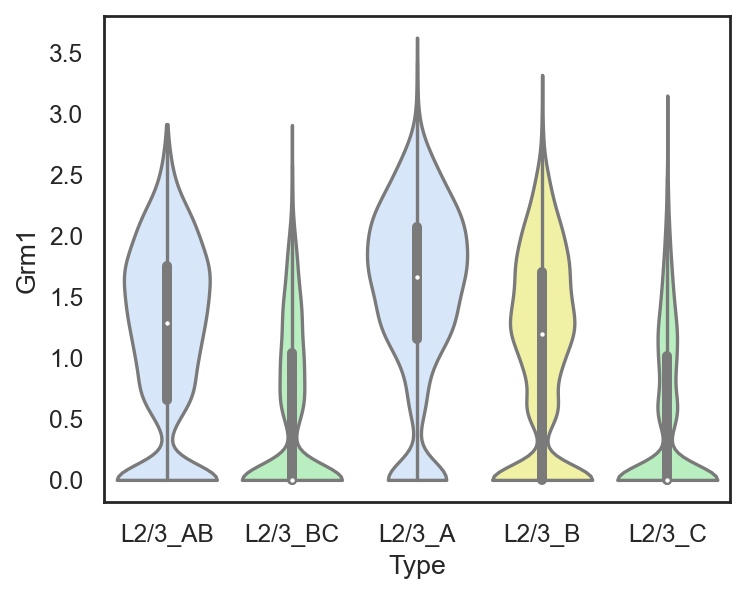

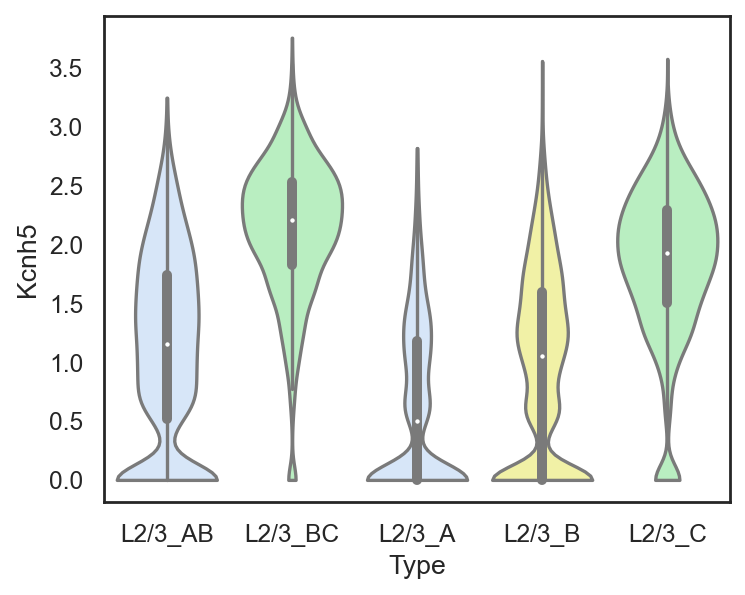

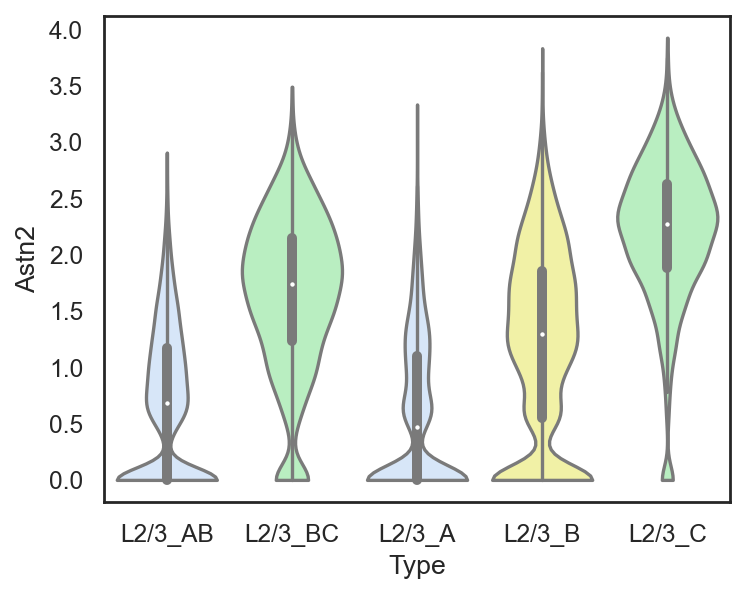

In [169]:
sc.set_figure_params(figsize=(5,4), dpi_save=200)
sn.set_style({'axes.grid' : False})
for gene in ['Cntn5', 'Grm1', 'Kcnh5', 'Astn2']:

    sc.pl.violin(L23, gene, groupby='Type', stripplot=False, inner='box',
                 palette={'L2/3_AB': '#d2e6fd', 'L2/3_BC':'#B0F7BB', 
                          'L2/3_A':'#D2E6FD', 'L2/3_B':'#FDFD99', 'L2/3_C':'#B0F7BB'},
                 order=['L2/3_AB', 'L2/3_BC', 'L2/3_A', 'L2/3_B', 'L2/3_C'], edgecolor='black',
                 save='Figure4_'+gene+'.pdf',)


# Gluta heat map

In [205]:
#code for savio
adata = sc.read_h5ad('gluta_full_041921.h5ad')

subs = []
for i in adata.obs.Subclass.values.categories:
    sub = adata[adata.obs.Subclass==i,:]
    
    sc.pp.subsample(sub, n_obs=1200)
    subs.append(sub)
    
adata_subs = subs[0].concatenate(subs[1:])

adata_subs.write_h5ad('gluta_subclasses_subsampled.h5ad')

OSError: Unable to open file (unable to open file: name = 'gluta_full_041921.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [32]:
adata_subs = sc.read_h5ad('gluta_subclasses_subsampled.h5ad')

In [207]:
sc.pp.subsample(adata_subs, fraction=0.25)

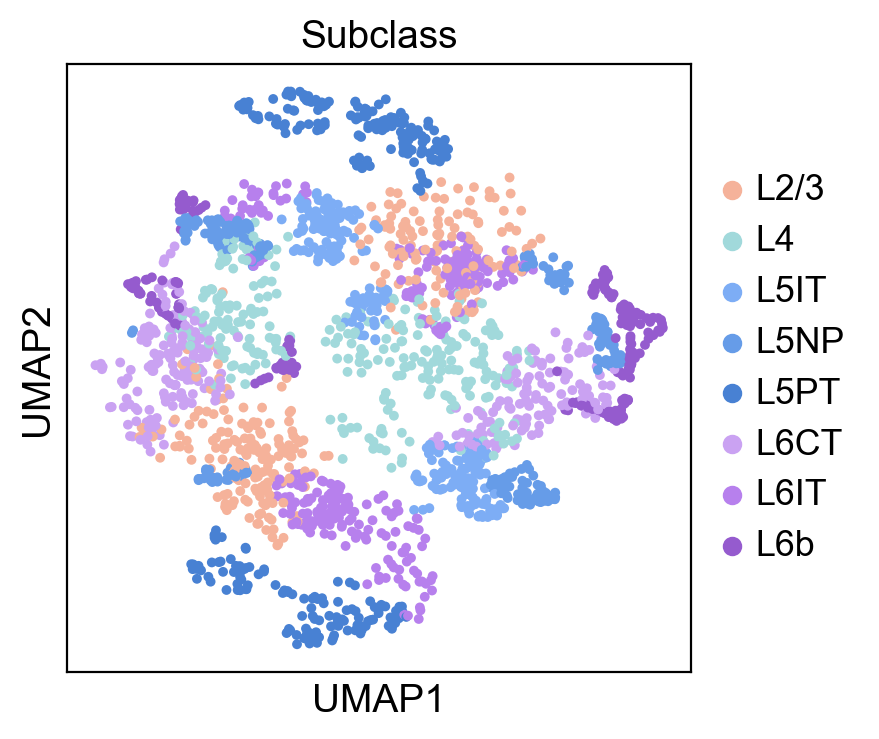

In [208]:
sc.pl.umap(adata_subs, color='Subclass', palette=['#f5b29a', 
                                                  '#A1D9DB', 
                                        '#7dadf5', '#669ce8','#4881D3', 
                                         '#caa2f2','#b780ed', '#955BCE', ])

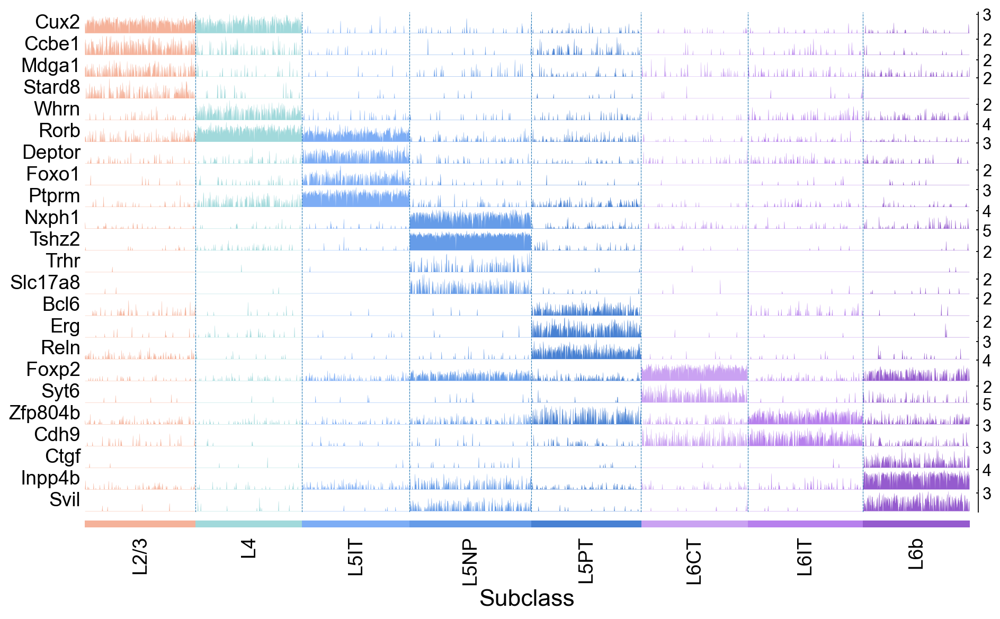

In [209]:
sc.set_figure_params(fontsize=20, dpi_save=200)
hm_markers = ['Cux2', 'Ccbe1', 'Mdga1', 'Stard8',
              'Whrn', 'Rorb',
              'Deptor', 'Foxo1', 'Ptprm',
              'Nxph1', 'Tshz2', 'Trhr', 'Slc17a8',
              'Bcl6', 'Erg', 'Reln', 
              
              'Foxp2', 'Syt6',
              'Zfp804b','Cdh9', 
              'Ctgf', 'Inpp4b', 'Svil']

cats = ['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b']

sc.pl.tracksplot(adata_subs, var_names=hm_markers, groupby='Subclass',
                figsize=(14,8), save='Figure2B.pdf')
#a['mainplot_ax'].set_yticklabels(labels=hm_markers,fontstyle='italic')
plt.show()


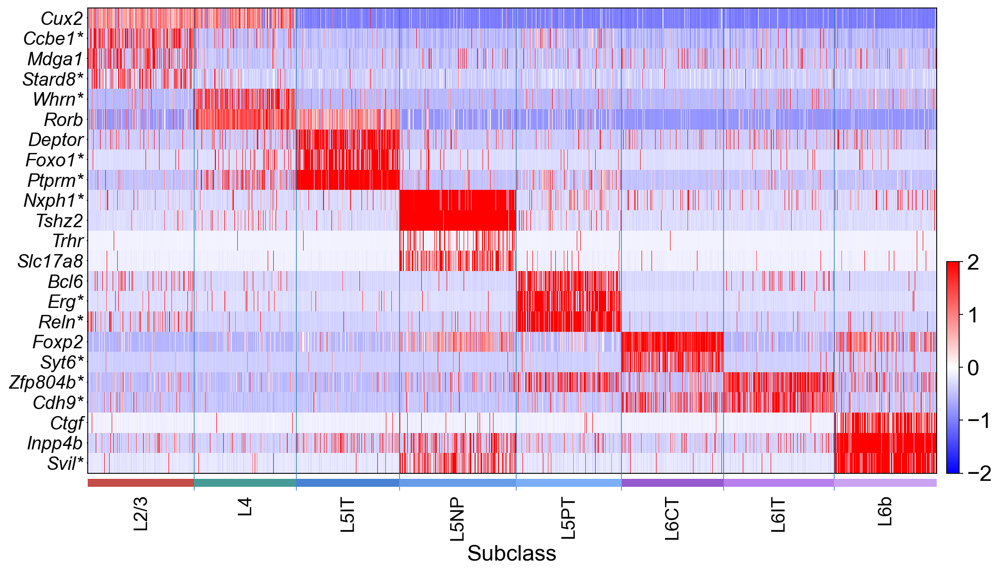

In [96]:
a = sc.pl.heatmap(adata_subs, var_names=hm_markers, groupby='Subclass',swap_axes=True,
             cmap='bwr', use_raw=False, vmax=2, vmin=-2, show=False, figsize=(14,8))['heatmap_ax']
a.set_yticklabels(labels=['Cux2', 'Ccbe1*', 'Mdga1', 'Stard8*',
              'Whrn*', 'Rorb',
              'Deptor', 'Foxo1*', 'Ptprm*',
              'Nxph1*', 'Tshz2', 'Trhr', 'Slc17a8',
              'Bcl6', 'Erg*', 'Reln*', 
              
              'Foxp2', 'Syt6*',
              'Zfp804b*','Cdh9*', 
              'Ctgf', 'Inpp4b', 'Svil*'],fontstyle='italic')

plt.savefig('Figure2B_ticks.pdf')
plt.show()

In [3]:
gluta_sub = sc.read_h5ad('glut_sub_021822.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


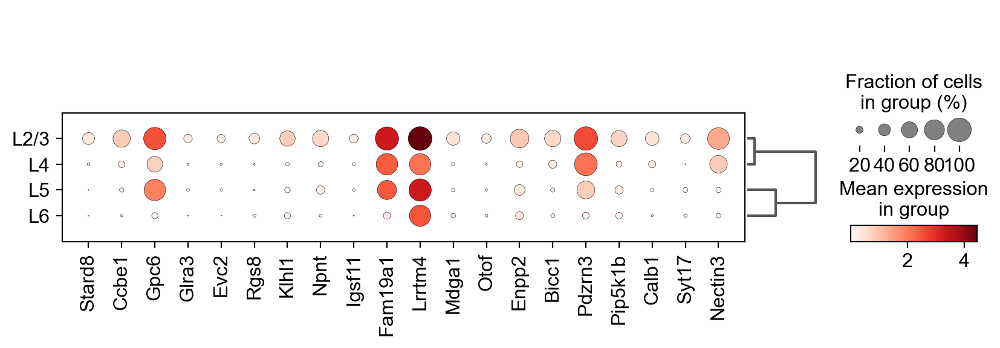

['Stard8', 'Ccbe1', 'Gpc6', 'Glra3', 'Evc2', 'Rgs8']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


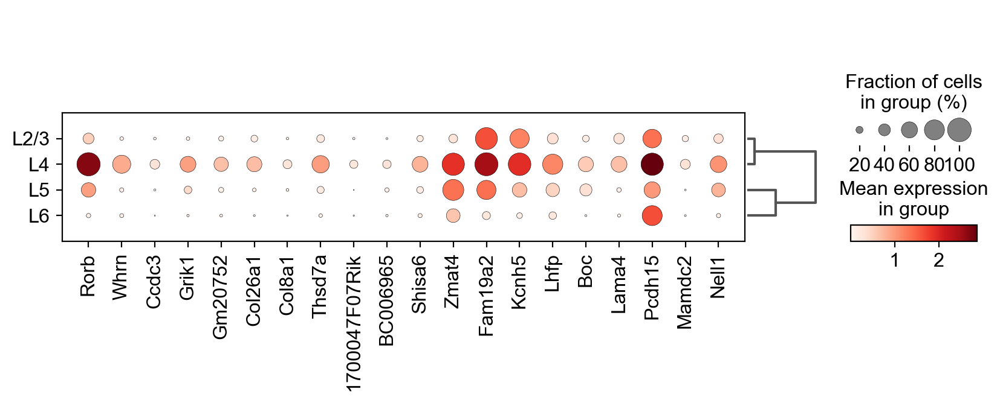

['Rorb', 'Whrn', 'Ccdc3', 'Grik1', 'Gm20752', 'Col26a1']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


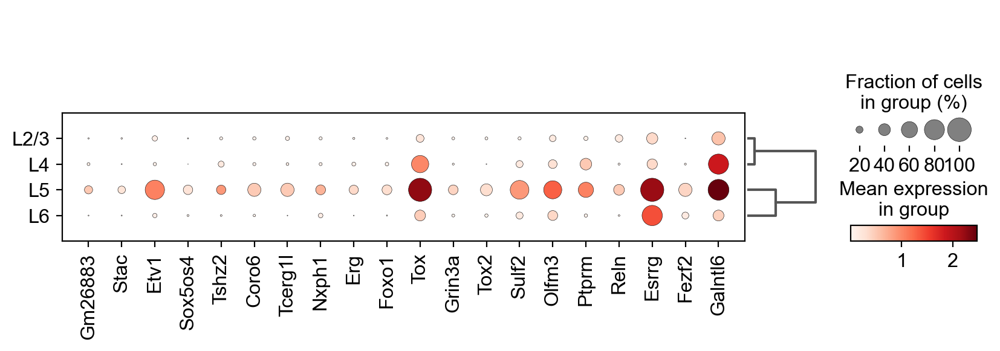

['Gm26883', 'Stac', 'Etv1', 'Sox5os4', 'Tshz2', 'Coro6']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


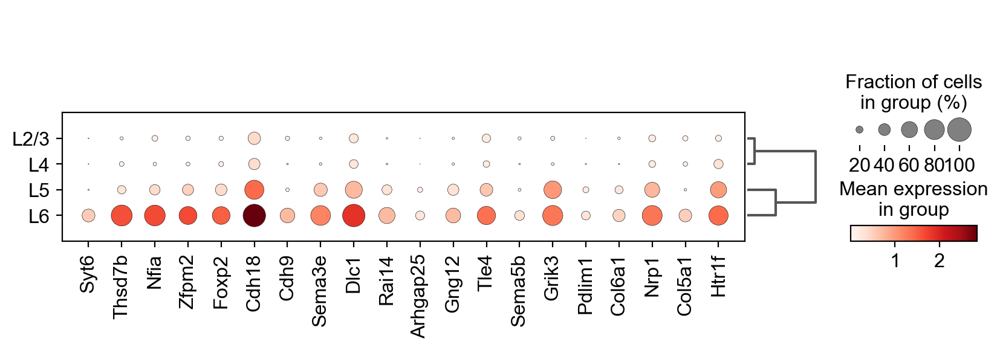

['Syt6', 'Thsd7b', 'Nfia', 'Zfpm2', 'Foxp2', 'Cdh18']


In [5]:
for i in gluta_sub.obs.Layer.values.categories:
    Layer = i
    sc.tl.rank_genes_groups(gluta_sub, groupby='Layer', groups=[Layer], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(gluta_sub.uns['rank_genes_groups']['names'].astype([(Layer, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = gluta_sub.uns['rank_genes_groups']['logfoldchanges'].astype([(Layer, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(gluta_sub.uns['rank_genes_groups']['names'].astype([(Layer, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = gluta_sub.uns['rank_genes_groups']['logfoldchanges'].astype([(Layer, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(gluta_sub, wilcGenes8v14_correct[0:20], groupby='Layer', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

Re-order subclasses

In [69]:
P8_glut.obs['Subclass'] = P8_glut.obs['Subclass'].cat.reorder_categories(['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b'], ordered=True)
P14_glut.obs['Subclass'] = P14_glut.obs['Subclass'].cat.reorder_categories(['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b'], ordered=True)
P17_glut.obs['Subclass'] = P17_glut.obs['Subclass'].cat.reorder_categories(['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b'], ordered=True)
P21_glut.obs['Subclass'] = P21_glut.obs['Subclass'].cat.reorder_categories(['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b'], ordered=True)
P28_glut.obs['Subclass'] = P28_glut.obs['Subclass'].cat.reorder_categories(['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b'], ordered=True)
P38_glut.obs['Subclass'] = P38_glut.obs['Subclass'].cat.reorder_categories(['L2/3', 'L4', 'L6CT', 'L6IT', 'L5PT', 'L5IT', 'L5NP', 'L6b'], ordered=True)

Downsample objects and concat

In [66]:
sc.pp.subsample(P8_glut, fraction=0.2)
sc.pp.subsample(P14_glut, fraction=0.2)
sc.pp.subsample(P17_glut, fraction=0.2)
sc.pp.subsample(P21_glut, fraction=0.2)
sc.pp.subsample(P28_glut, fraction=0.2)
sc.pp.subsample(P38_glut, fraction=0.2)

In [71]:
gluta_hm = P8_glut.concatenate(P14_glut, P17_glut, P21_glut, P28_glut, P38_glut)

Make plot

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


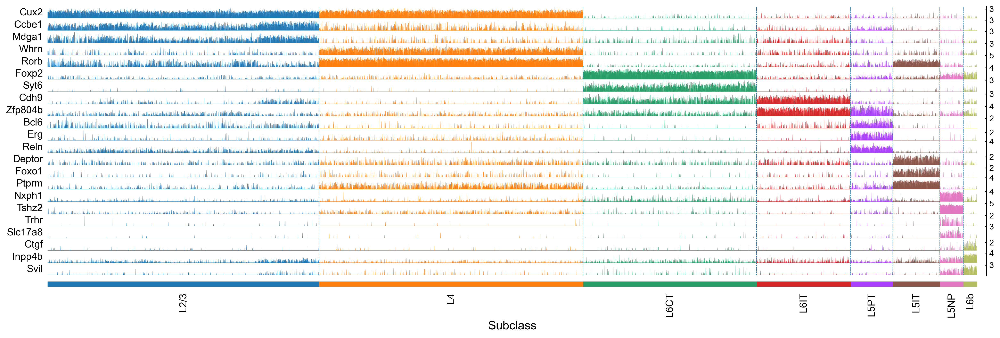

In [72]:
hm_markers = ['Cux2', 'Ccbe1', 'Mdga1', 'Stard8',
              'Whrn', 'Rorb',
              'Foxp2', 'Syt6',
              'Cdh9', 'Zfp804b',
              'Bcl6', 'Erg', 'Reln', 
              'Deptor', 'Foxo1', 'Ptprm',
              'Nxph1', 'Tshz2', 'Trhr', 'Slc17a8',
              'Ctgf', 'Inpp4b', 'Svil']
sc.pl.tracksplot(gluta_hm, hm_markers, groupby='Subclass',  figsize=(20,6), save='Figure2.pdf')

Find new markers for subclasses

In [31]:
for i in gluta_hm.obs.Subclass.values.categories:
    print(i)

L2/3
L4
L6CT
L6IT
L5PT
L5IT
L5NP
L6b


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


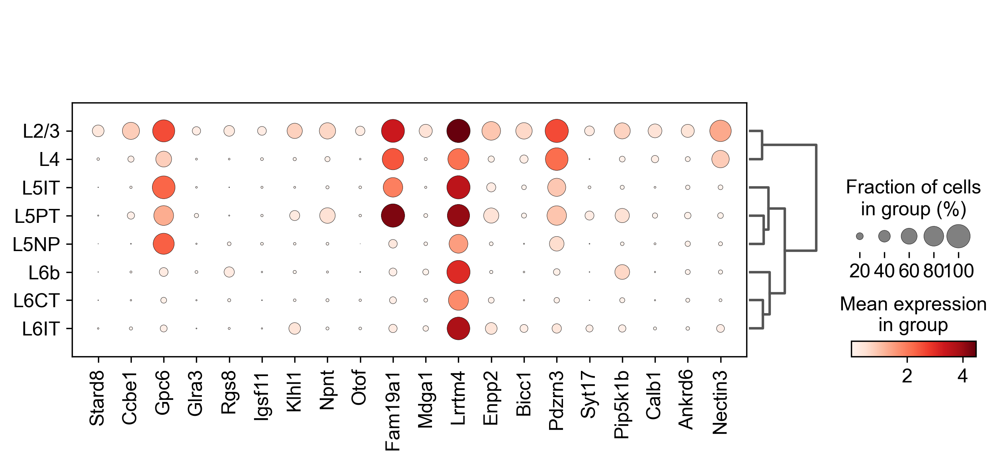

['Stard8', 'Ccbe1', 'Gpc6', 'Glra3', 'Rgs8', 'Igsf11']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


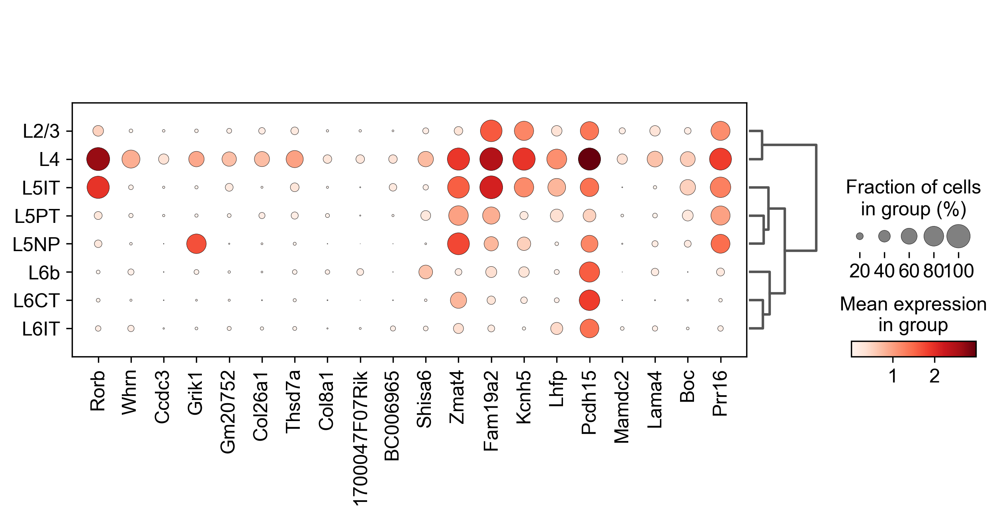

['Rorb', 'Whrn', 'Ccdc3', 'Grik1', 'Gm20752', 'Col26a1']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


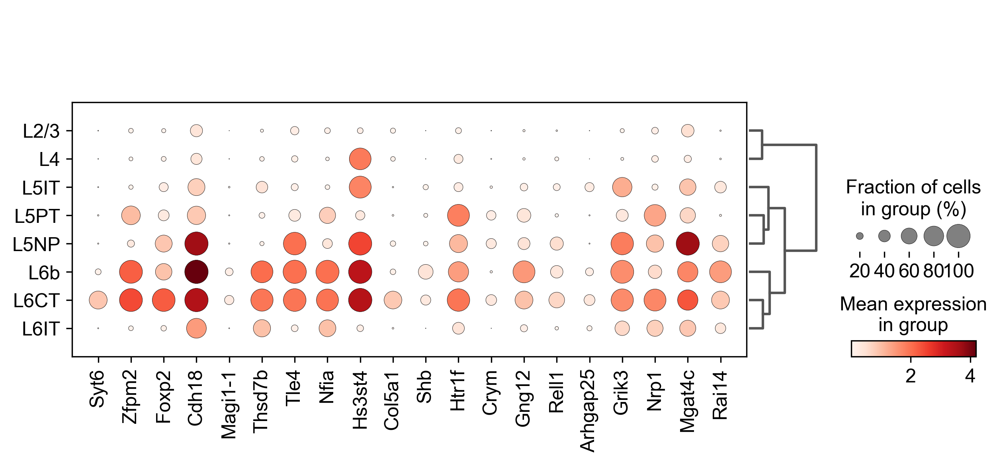

['Syt6', 'Zfpm2', 'Foxp2', 'Cdh18', 'Magi1-1', 'Thsd7b']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


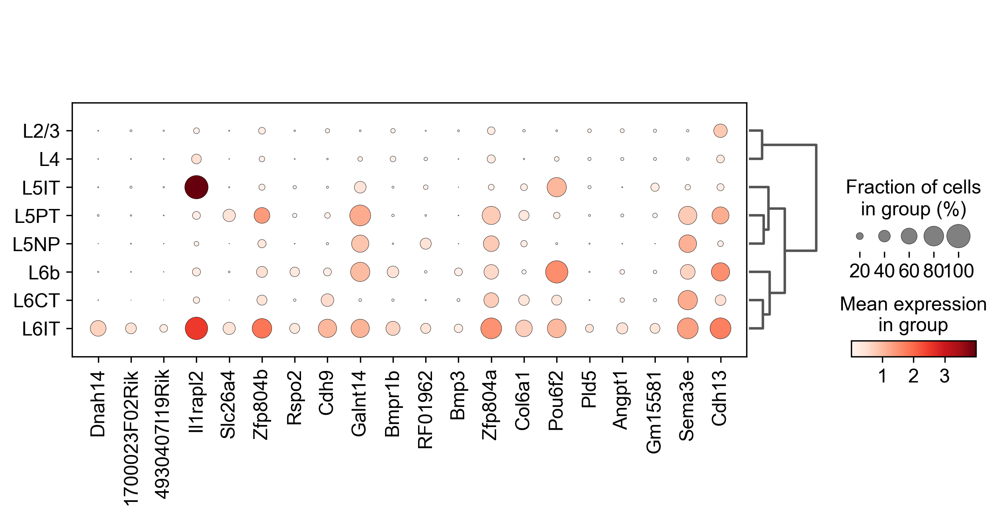

['Dnah14', '1700023F02Rik', '4930407I19Rik', 'Il1rapl2', 'Slc26a4', 'Zfp804b']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


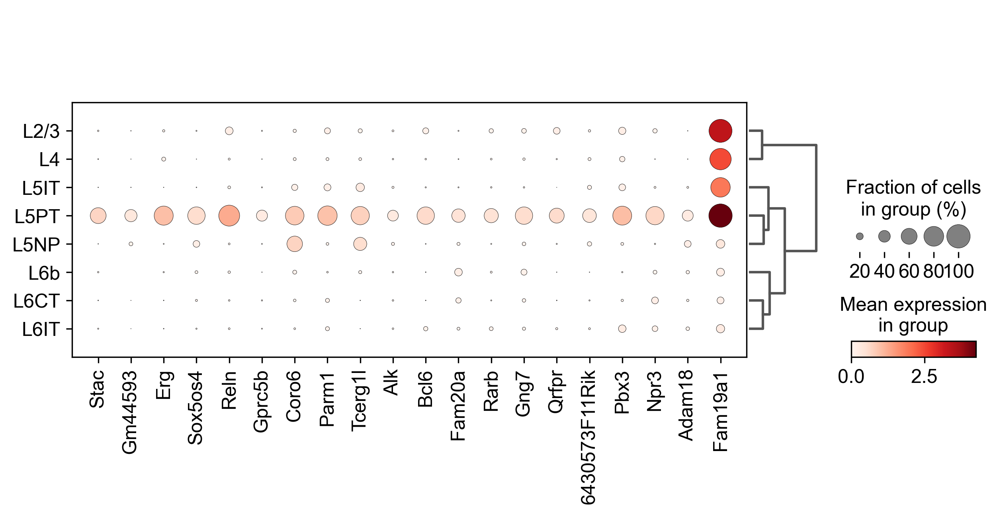

['Stac', 'Gm44593', 'Erg', 'Sox5os4', 'Reln', 'Gprc5b']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


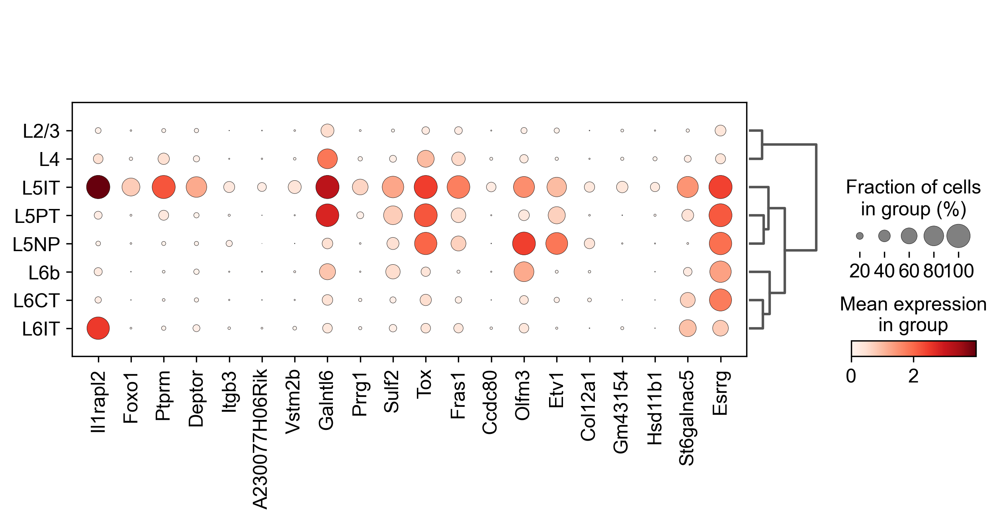

['Il1rapl2', 'Foxo1', 'Ptprm', 'Deptor', 'Itgb3', 'A230077H06Rik']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


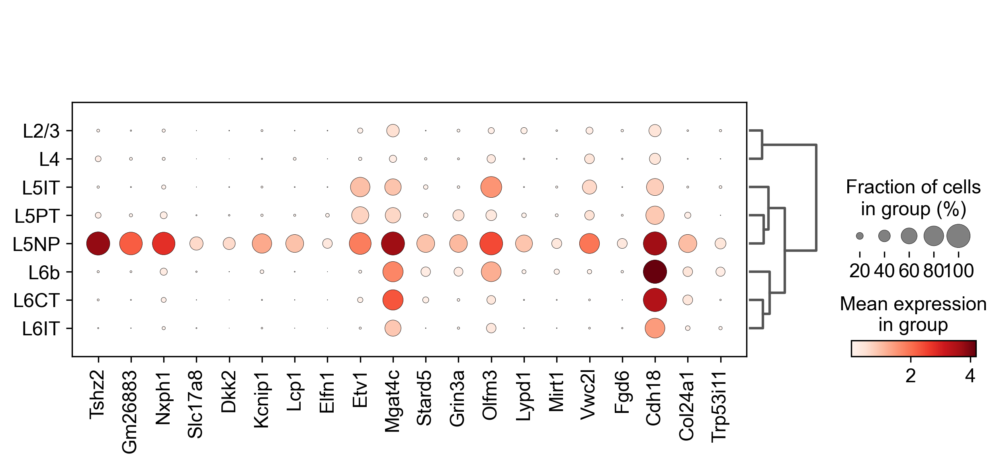

['Tshz2', 'Gm26883', 'Nxph1', 'Slc17a8', 'Dkk2', 'Kcnip1']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


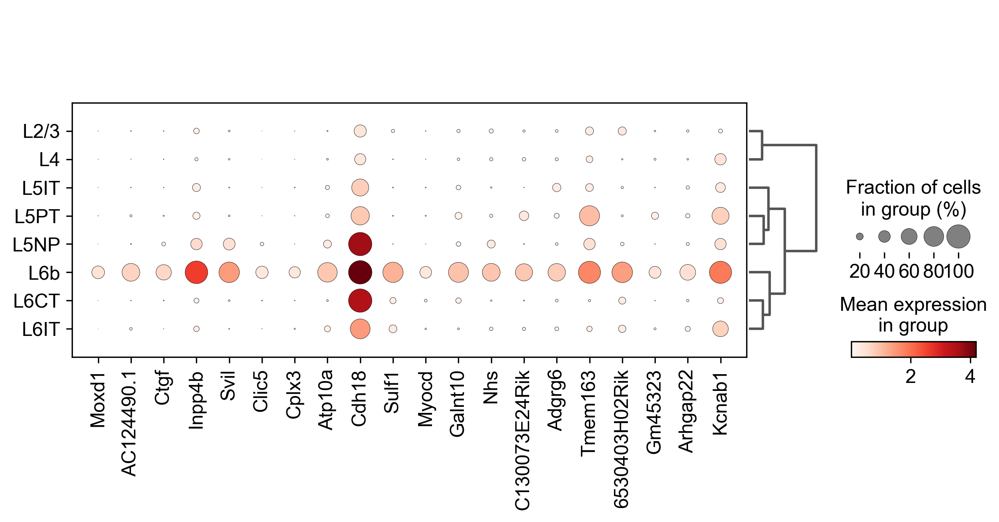

['Moxd1', 'AC124490.1', 'Ctgf', 'Inpp4b', 'Svil', 'Clic5']


In [32]:
for i in gluta_hm.obs.Subclass.values.categories:
    Subclass = i
    sc.tl.rank_genes_groups(gluta_hm, groupby='Subclass', groups=[Subclass], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(gluta_hm.uns['rank_genes_groups']['names'].astype([(Subclass, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = gluta_hm.uns['rank_genes_groups']['logfoldchanges'].astype([(Subclass, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(gluta_hm.uns['rank_genes_groups']['names'].astype([(Subclass, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = gluta_hm.uns['rank_genes_groups']['logfoldchanges'].astype([(Subclass, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(gluta_hm, wilcGenes8v14_correct[0:20], groupby='Subclass', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

In [164]:
P38_glut[P38_glut.obs.cluster=='L6IT_A',:]

View of AnnData object with n_obs × n_vars = 901 × 30869 
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'Doublet', 'Doublet Score', 'cluster', 'Class_broad', 'sample', 'Age', 'subclass'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cluster_colors', 'dendrogram_cluster', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'neighbors', 'sample_colors', 'umap', 'rank_genes_groups'
    obsm: 'SC', 'X_umap'
    obsp: 'connectivities', 'distances'

# Relative frequency

## L2/3

In [33]:
freqs_23 = [[], [], []] 
ages = L23.obs.Age.values.categories
types = L23.obs.P28_Type.values.categories
f = 0
for i in types:
    for j in ages:
        age = L23[L23.obs.Age==j,:]
        age_freqs = age.obs.P28_Type.value_counts(normalize=True)
        freqs_23[f].append(age_freqs[i])
        
    f = f + 1

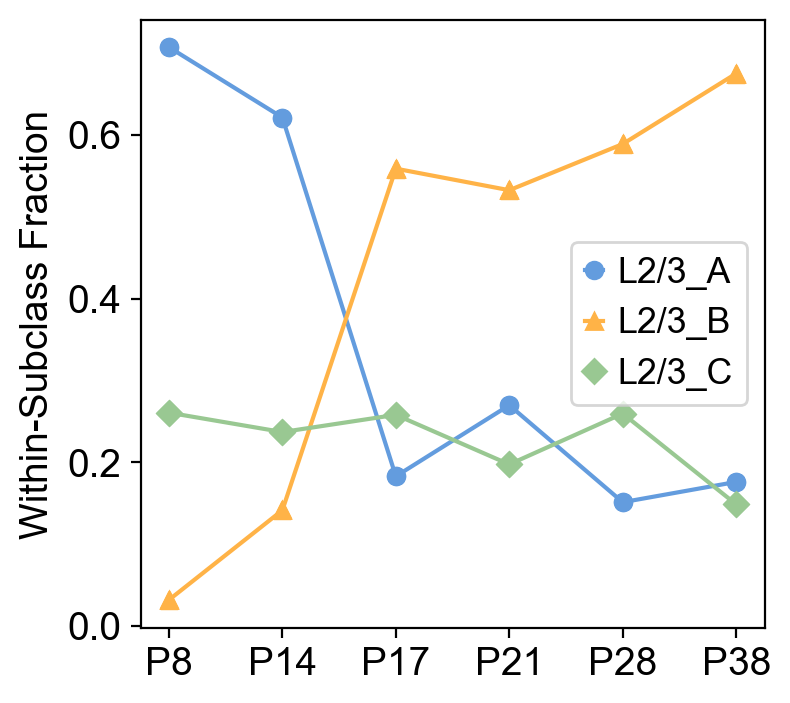

In [48]:
markers = ['o', '^', 'D']
palette=['#639CDE', '#ffb347', '#99C892']

for count, type_ in enumerate(types):
    plt.scatter(ages, freqs_23[count], marker = markers[count], color=palette[count])
    plt.plot(ages, freqs_23[count], label=type_, marker = markers[count], color=palette[count])
    
#plt.legend(bbox_to_anchor=(1, 1))
plt.legend()
plt.ylabel('Within-Subclass Fraction')
plt.grid(False)
plt.savefig('L23_type_freqs.pdf')

## L4

In [359]:
L4 = P8_glut[P8_glut.obs.Subclass=='L4',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L4',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L4',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L4',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L4',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L4',:])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [362]:
#L4.write_h5ad('L4_021522.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


In [50]:
ABC = [[], [], []]

ages = L4.obs.Age.values.categories
for i in ages:
    age = L4[L4.obs.Age==i,:]
    age_freqs = age.obs.Type.value_counts(normalize=True)
    
    ABC[0].append(age_freqs['L4_A'])
    ABC[1].append(age_freqs['L4_B'])
    ABC[2].append(age_freqs['L4_C'])

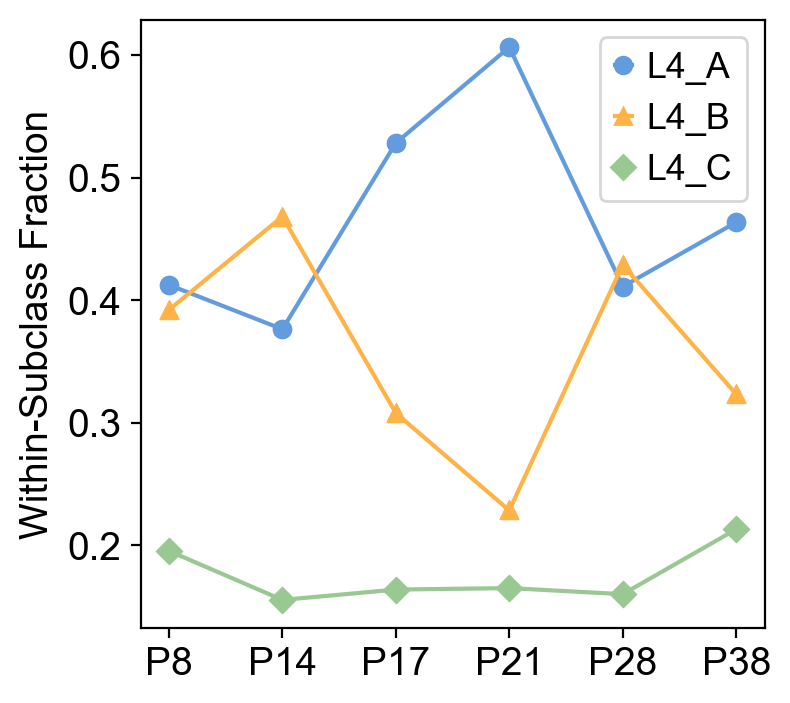

In [52]:
markers = ['o', '^', 'D']
palette=['#639CDE', '#ffb347', '#99C892']
types_L4 = L4.obs.Type.values.categories

for count, type_ in enumerate(types_L4):
    plt.scatter(ages, ABC[count], marker = markers[count], color=palette[count])
    plt.plot(ages, ABC[count], label=type_, marker = markers[count], color=palette[count])
    
#plt.legend(bbox_to_anchor=(1, 1))
plt.legend()
plt.ylabel('Within-Subclass Fraction')
plt.grid(False)
plt.savefig('L4_type_freqs.pdf')

## L5

In [68]:
freqs_5 = [[], [], [], []] 
ages = L5.obs.Age.values.categories
types = L5.obs.Type.values.categories
f = 0
for i in types:
    for j in ages:
        age = L5[L5.obs.Age==j,:]
        age_freqs = age.obs.Type.value_counts(normalize=True)
        freqs_5[f].append(age_freqs[i])
        
    f = f + 1

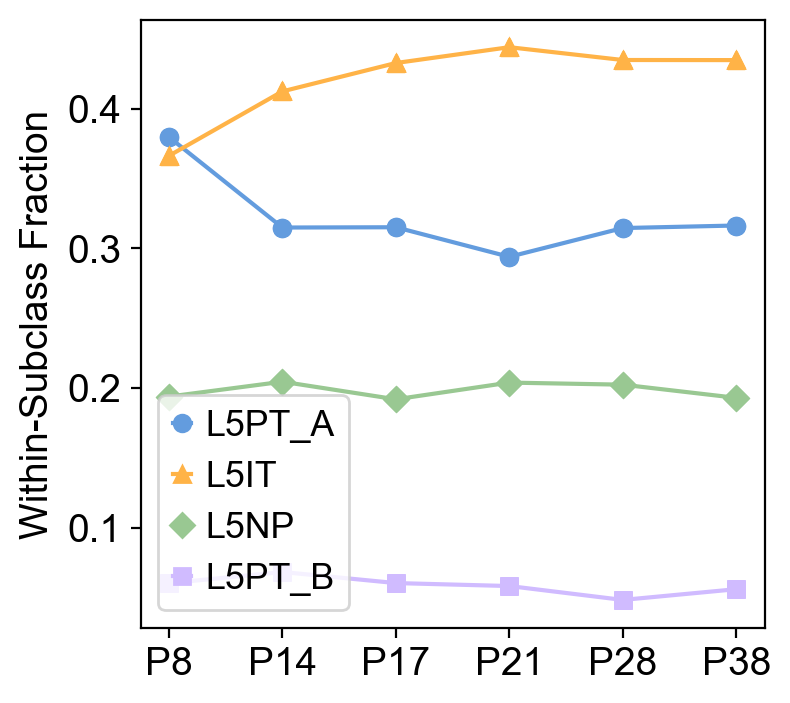

In [84]:
markers = ['o', '^', 'D', 's']
palette=['#639CDE', '#ffb347', '#99C892', '#d0bbff',]

for count, type_ in enumerate(types):
    plt.scatter(ages, freqs_5[count], marker = markers[count], color=palette[count])
    plt.plot(ages, freqs_5[count], label=type_, marker = markers[count], color=palette[count])
    
#plt.legend(bbox_to_anchor=(1, 1))
plt.legend()
plt.ylabel('Within-Subclass Fraction')
plt.grid(False)
plt.savefig('L5_type_freqs.pdf')

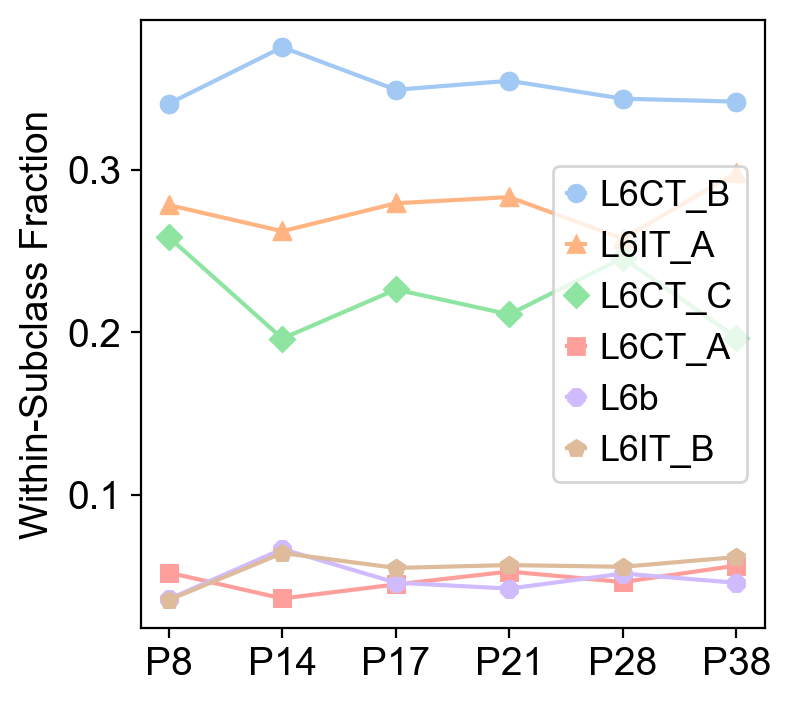

In [97]:
markers = ['o', '^', 'D', 's', '8', 'p']
palette = sns.color_palette('pastel').as_hex()

for count, type_ in enumerate(types):
    plt.scatter(ages, freqs_6[count], marker = markers[count], color=palette[count])
    plt.plot(ages, freqs_6[count], label=type_, marker = markers[count], color=palette[count])
    
#plt.legend(bbox_to_anchor=(1, 1))
plt.legend()
plt.ylabel('Within-Subclass Fraction')
plt.grid(False)
plt.savefig('L6_type_freqs.pdf')

## L6

In [88]:
freqs_6 = [[], [], [], [], [], []] 
ages = L6.obs.Age.values.categories
types = L6.obs.Type.values.categories
f = 0
for i in types:
    for j in ages:
        age = L6[L6.obs.Age==j,:]
        age_freqs = age.obs.Type.value_counts(normalize=True)
        freqs_6[f].append(age_freqs[i])
        
    f = f + 1

## Subclasss across age

In [15]:
ages = ['P8', 'P14', 'P17', 'P21', 'P28', 'P38']

layer_freqs = [[], [], [], []]
layers = ['L2/3', 'L4', 'L5', 'L6']

for j in range(len(layers)):
    for i in ages:
        f = gluta_sub[gluta_sub.obs.Age==i,:].obs.Layer.value_counts(normalize=True)[layers[j]]
        layer_freqs[j].append(f)

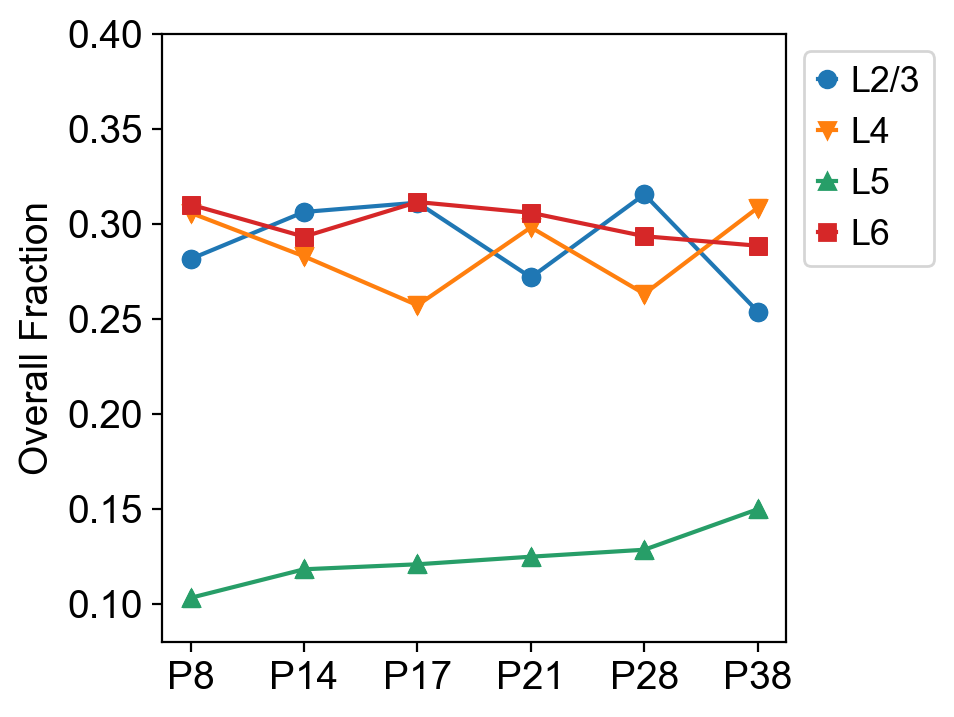

In [27]:
marker = ['o', 'v', '^', 's']


for i in range(len(layer_freqs)):
    plt.plot(ages, layer_freqs[i], label=layers[i], marker = marker[i])
    plt.scatter(ages, layer_freqs[i], marker = marker[i])
    
plt.ylabel('Overall Fraction')
plt.grid(False)
plt.ylim([0.08,0.4])
plt.legend(bbox_to_anchor=(1, 1))


In [33]:
Subclass_order = adata_subs.obs.Subclass.values.categories

In [25]:
objs = [P8_glut, P14_glut, P17_glut, P21_glut, P28_glut, P38_glut]

In [35]:
ages = ['P8', 'P14', 'P17', 'P21', 'P28', 'P38']

In [27]:
sc.set_figure_params(dpi_save=200)

In [20]:
P8_glut

AnnData object with n_obs × n_vars = 11914 × 30869
    obs: 'Age', 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'cluster', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'subclass', 'C26_decision', 'layer', 'Type', 'Subclass', 'leiden_new', 'P28_Type'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'mean', 'std', 'dispersions-0', 'dispersions_norm-0', 'dispersions-1', 'dispersions_norm-1'
    uns: 'P28_Type_colors', 'Type_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [30]:
P8_glut.uns['Subclass_colors']

['#f5b29a',
 '#A1D9DB',
 '#7dadf5',
 '#669ce8',
 '#4881D3',
 '#caa2f2',
 '#b780ed',
 '#955BCE']

In [39]:
palette=['#f5b29a', 
         '#A1D9DB', 
         '#7dadf5', '#669ce8','#4881D3',
         '#caa2f2','#b780ed', '#955BCE', ]


In [36]:
plt.figure(figsize=(6,5))

marker = ['o', 'v', '^', 'D', 's', 'p', '*', 'X']

idx = 0
for Subclass in Subclass_order:
    


    plt.scatter(ages, [P8_glut[P8_glut.obs.Subclass==Subclass,:].shape[0]*100/P8_glut.shape[0], P14_glut[P14_glut.obs.Subclass==Subclass,:].shape[0]*100/P14_glut.shape[0],
     P17_glut[P17_glut.obs.Subclass==Subclass,:].shape[0]*100/P17_glut.shape[0], P21_glut[P21_glut.obs.Subclass==Subclass,:].shape[0]*100/P21_glut.shape[0], 
     P28_glut[P28_glut.obs.Subclass==Subclass,:].shape[0]*100/P28_glut.shape[0], P38_glut[P38_glut.obs.Subclass==Subclass,:].shape[0]*100/P38_glut.shape[0]], 
                marker=marker[idx], color=palette[idx], linewidths=2, edgecolors='black')
    
    plt.plot(ages, [P8_glut[P8_glut.obs.Subclass==Subclass,:].shape[0]*100/P8_glut.shape[0], P14_glut[P14_glut.obs.Subclass==Subclass,:].shape[0]*100/P14_glut.shape[0],
     P17_glut[P17_glut.obs.Subclass==Subclass,:].shape[0]*100/P17_glut.shape[0], P21_glut[P21_glut.obs.Subclass==Subclass,:].shape[0]*100/P21_glut.shape[0], 
     P28_glut[P28_glut.obs.Subclass==Subclass,:].shape[0]*100/P28_glut.shape[0], P38_glut[P38_glut.obs.Subclass==Subclass,:].shape[0]*100/P38_glut.shape[0]], label=Subclass, 
             marker=marker[idx], color=palette[idx],)
    
    plt.ylabel('Overall Frequency (%)', fontsize=16)
    plt.grid(False)
    plt.legend(bbox_to_anchor=(1, 1))
    idx = idx + 1

plt.xticks(fontsize=16)
plt.tight_layout()


NameError: name 'P8_glut' is not defined

<Figure size 600x500 with 0 Axes>

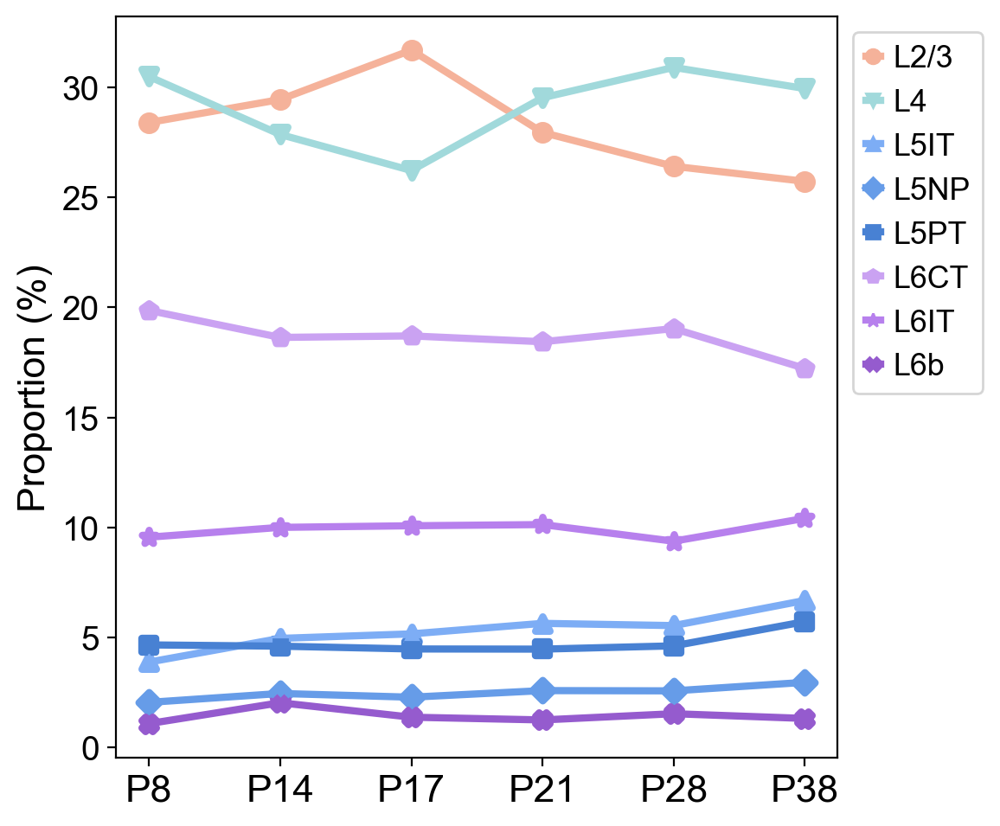

In [49]:
plt.figure(figsize=(6,5))

marker = ['o', 'v', '^', 'D', 's', 'p', '*', 'X']

idx = 0
for Subclass in Subclass_order:
    


    plt.scatter(ages, [P8_glut[P8_glut.obs.Subclass==Subclass,:].shape[0]*100/P8_glut.shape[0], P14_glut[P14_glut.obs.Subclass==Subclass,:].shape[0]*100/P14_glut.shape[0],
     P17_glut[P17_glut.obs.Subclass==Subclass,:].shape[0]*100/P17_glut.shape[0], P21_glut[P21_glut.obs.Subclass==Subclass,:].shape[0]*100/P21_glut.shape[0], 
     P28_glut[P28_glut.obs.Subclass==Subclass,:].shape[0]*100/P28_glut.shape[0], P38_glut[P38_glut.obs.Subclass==Subclass,:].shape[0]*100/P38_glut.shape[0]], 
                marker=marker[idx], color=palette[idx], linewidths=3,)
    
    plt.plot(ages, [P8_glut[P8_glut.obs.Subclass==Subclass,:].shape[0]*100/P8_glut.shape[0], P14_glut[P14_glut.obs.Subclass==Subclass,:].shape[0]*100/P14_glut.shape[0],
     P17_glut[P17_glut.obs.Subclass==Subclass,:].shape[0]*100/P17_glut.shape[0], P21_glut[P21_glut.obs.Subclass==Subclass,:].shape[0]*100/P21_glut.shape[0], 
     P28_glut[P28_glut.obs.Subclass==Subclass,:].shape[0]*100/P28_glut.shape[0], P38_glut[P38_glut.obs.Subclass==Subclass,:].shape[0]*100/P38_glut.shape[0]], label=Subclass, 
             marker=marker[idx], color=palette[idx], linewidth=3)
    
    plt.ylabel('Proportion (%)', fontsize=16)
    plt.grid(False)
    plt.legend(bbox_to_anchor=(1, 1))
    idx = idx + 1

plt.xticks(fontsize=16)
plt.tight_layout()
plt.savefig('Figure4C.pdf')

# L5/6 Markers

In [53]:
P8_glut.obs.Subclass

AAACCCAGTGAGACGT-1-P8_1a-P8-P8_glut-0    L6CT
AAACCCATCTGCGATA-1-P8_1a-P8-P8_glut-0      L4
AAACGCTCACTTCATT-1-P8_1a-P8-P8_glut-0    L2/3
AAACGCTGTCGTTTCC-1-P8_1a-P8-P8_glut-0    L6CT
AAAGAACCAGAGTGAC-1-P8_1a-P8-P8_glut-0      L4
                                         ... 
TTGGATGCACTTGACA-1-P8_2b-P8-1            L5IT
TTGGGTATCTTAATCC-1-P8_2b-P8-1            L5IT
TTTACTGAGGACGCAT-1-P8_2b-P8-1            L5IT
TTTCATGAGTCTGTAC-1-P8_2b-P8-1            L5IT
TTTGGTTGTTAGGCTT-1-P8_2b-P8-1            L5IT
Name: Subclass, Length: 11915, dtype: category
Categories (8, object): ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b']

## L5IT/NP

L5IT: 'Foxo1', 'Ptprm', 'Deptor' and Nxph1, Tshz2, Trhr

In [6]:
P8_glut.obs['Age'] = ['P8'] * P8_glut.shape[0]

In [33]:
L5IT = P8_glut[P8_glut.obs.Subclass=='L5IT',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L5IT',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L5IT',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L5IT',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L5IT',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L5IT',:])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


## L5PT

In [7]:
L5PT = P8_glut[P8_glut.obs.Subclass=='L5PT',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L5PT',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L5PT',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L5PT',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L5PT',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L5PT',:])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Age' as categorical
... storing 'Class_broad' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'layer' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


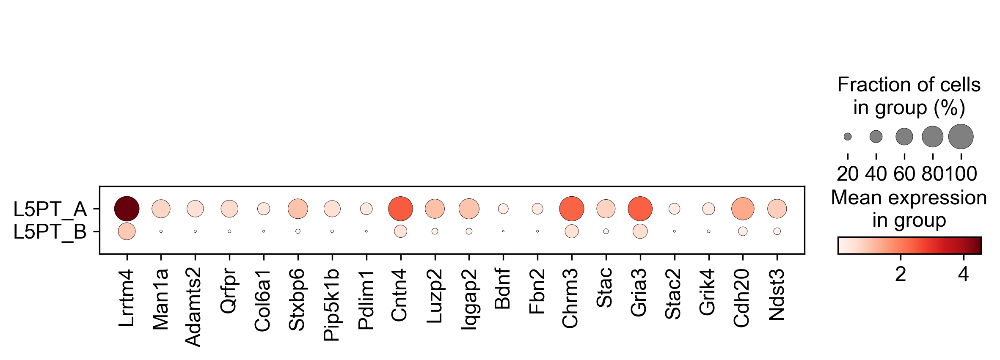

['Lrrtm4', 'Man1a', 'Adamts2', 'Qrfpr', 'Col6a1', 'Stxbp6']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


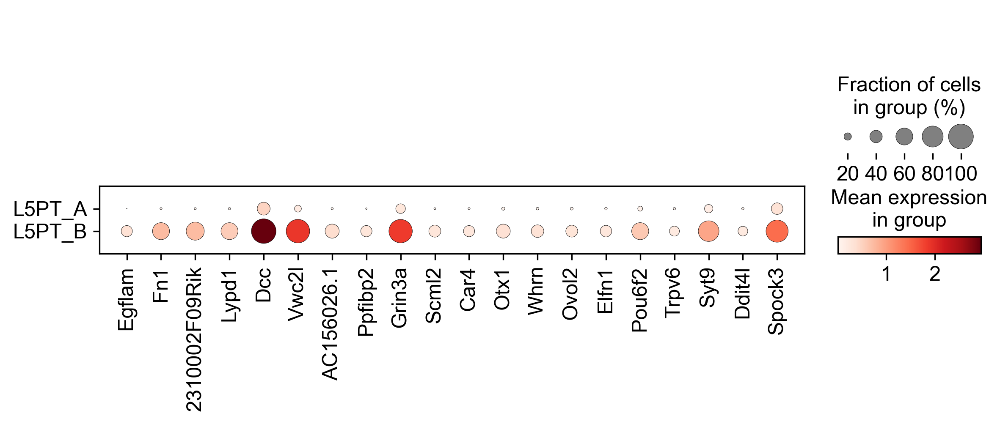

['Egflam', 'Fn1', '2310002F09Rik', 'Lypd1', 'Dcc', 'Vwc2l']


In [55]:
for i in L5PT.obs.Type.values.categories:
    Type = i
    sc.tl.rank_genes_groups(L5PT, groupby='Type', groups=[Type], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(L5PT.uns['rank_genes_groups']['names'].astype([(Type, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = L5PT.uns['rank_genes_groups']['logfoldchanges'].astype([(Type, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(L5PT.uns['rank_genes_groups']['names'].astype([(Type, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = L5PT.uns['rank_genes_groups']['logfoldchanges'].astype([(Type, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(L5PT, wilcGenes8v14_correct[0:20], groupby='Type', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

## L6CT

In [63]:
L6CT = P8_glut[P8_glut.obs.Subclass=='L6CT',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L6CT',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L6CT',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L6CT',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L6CT',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L6CT',:])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Age' as categorical
... storing 'cluster' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'subclass' as categorical
... storing 'C26_decision' as categorical
... storing 'layer' as categorical
... storing 'leiden_new' as categorical
... storing 'sample_new' as categorical


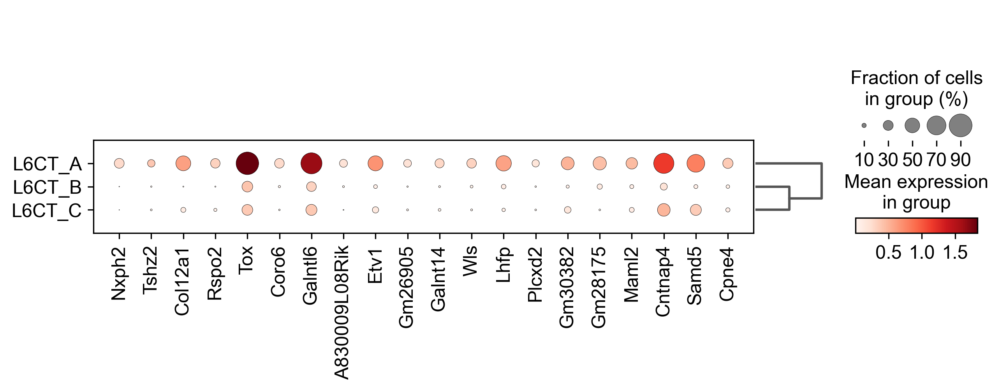

['Nxph2', 'Tshz2', 'Col12a1', 'Rspo2', 'Tox', 'Coro6']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


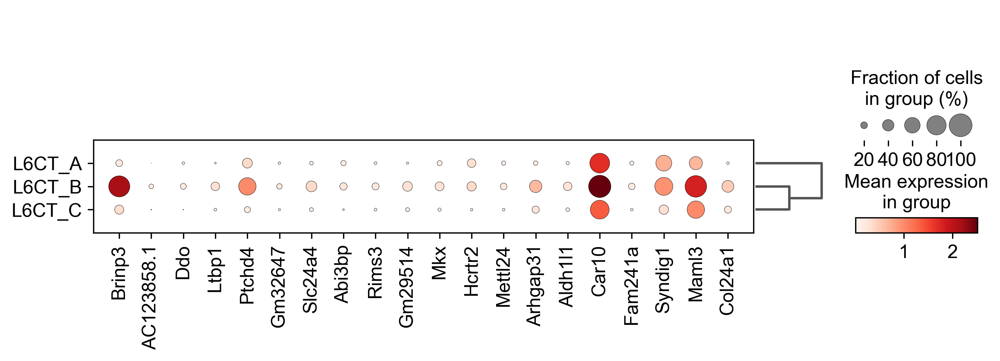

['Brinp3', 'AC123858.1', 'Ddo', 'Ltbp1', 'Ptchd4', 'Gm32647']


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


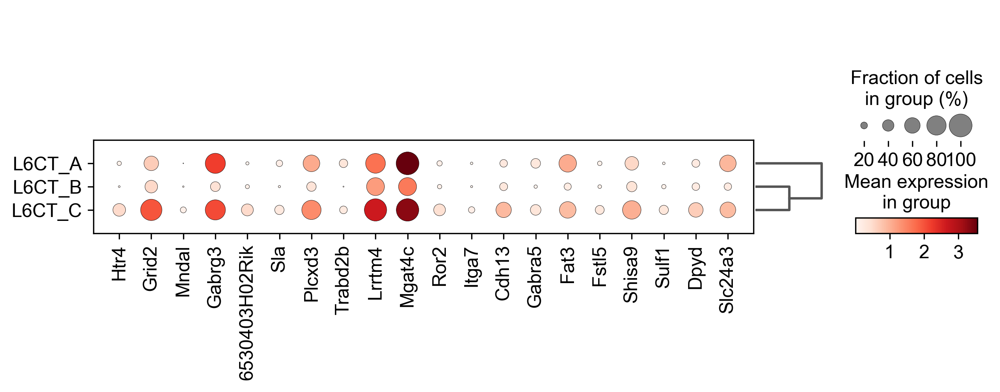

['Htr4', 'Grid2', 'Mndal', 'Gabrg3', '6530403H02Rik', 'Sla']


In [75]:
for i in L6CT.obs.Type.values.categories:
    Type = i
    sc.tl.rank_genes_groups(L6CT, groupby='Type', groups=[Type], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(L6CT.uns['rank_genes_groups']['names'].astype([(Type, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = L6CT.uns['rank_genes_groups']['logfoldchanges'].astype([(Type, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(L6CT.uns['rank_genes_groups']['names'].astype([(Type, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = L6CT.uns['rank_genes_groups']['logfoldchanges'].astype([(Type, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(L6CT, wilcGenes8v14_correct[0:20], groupby='Type', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

In [76]:
age_type = []
for i in range(L6CT.shape[0]):
    age_type.append(L6CT.obs.Age[i] + '_' + L6CT.obs.Type[i][-1])

L6CT.obs['age_type'] = L6CT.obs['Subclass']
L6CT.obs['age_type'] = pd.Categorical(age_type)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


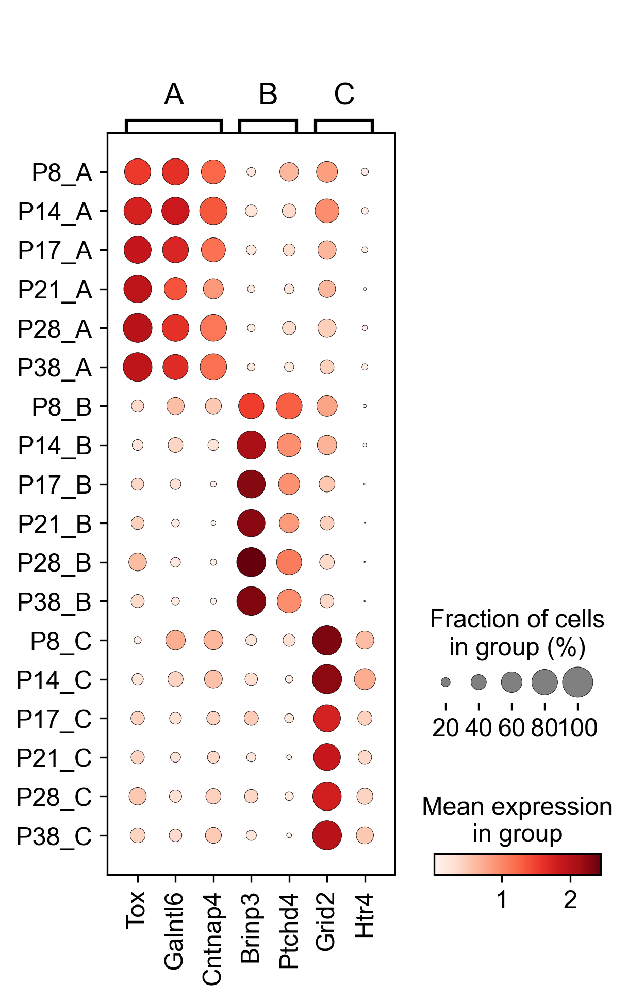

In [77]:
markers = ['Tox', 'Galntl6', 'Cntnap4',
          'Brinp3', 'Ptchd4', 
          'Grid2', 'Htr4']

cats = ['P8_A', 'P14_A', 'P17_A', 'P21_A', 'P28_A', 'P38_A',
        'P8_B', 'P14_B', 'P17_B', 'P21_B', 'P28_B', 'P38_B',
        'P8_C', 'P14_C', 'P17_C', 'P21_C', 'P28_C', 'P38_C']

fig = sc.pl.dotplot(L6CT, markers, groupby='age_type', categories_order = cats, 
              var_group_labels=['A', 'B', 'C'], 
              var_group_positions=[(0,2), (3,4), (5,6)], 
              var_group_rotation='0')

## L6IT

In [64]:
L6IT = P8_glut[P8_glut.obs.Subclass=='L6IT',:].concatenate(P14_glut[P14_glut.obs.Subclass=='L6IT',:], 
                                                               P17_glut[P17_glut.obs.Subclass=='L6IT',:], 
                                                               P21_glut[P21_glut.obs.Subclass=='L6IT',:], 
                                                               P28_glut[P28_glut.obs.Subclass=='L6IT',:], 
                                                               P38_glut[P38_glut.obs.Subclass=='L6IT',:])